# THTL

In [2]:
# Lae_stoi0（语音清晰度）：清晰度较高的模型在该指标上表现应为越高越好。
# Ldiff0（响度差异）：较小的差异意味着模型的表现越接近真实的音量。
# Lae_a10 和 Lae_db10：这些与音频信号的振幅和分贝有关，数值越小代表性能越好。
# amplitude_formants_noise_metric0：表示噪声成分，噪声越少越好。
# Seaborn Color Palettes
# https://seaborn.pydata.org/generated/seaborn.color_palette.html
# https://r02b.github.io/seaborn_palettes/

In [9]:
import librosa
import librosa.display
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.io.wavfile as wav
from scipy.io import wavfile
from scipy.signal import spectrogram
from scipy.stats import pearsonr
import pandas as pd
import numpy as np
import os

In [13]:
file_paths = [
    './output/e2a/HB02_3DSWIN_THTL/epoch_log_test.csv', 
    './output/e2a/HB02_BILSTM_THTL/epoch_log_test.csv',  
    './output/e2a/HB02_RESNET_THTL/epoch_log_test.csv',  
    './output/e2a/HB02_RNN_THTL/epoch_log_test.csv', 
    './output/e2a/HB02_TRANS_THTL/epoch_log_test.csv', 
]
dfs = [pd.read_csv(file_path) for file_path in file_paths]
#dfs[0].head(), dfs[1].head(), dfs[2].head(), dfs[3].head()

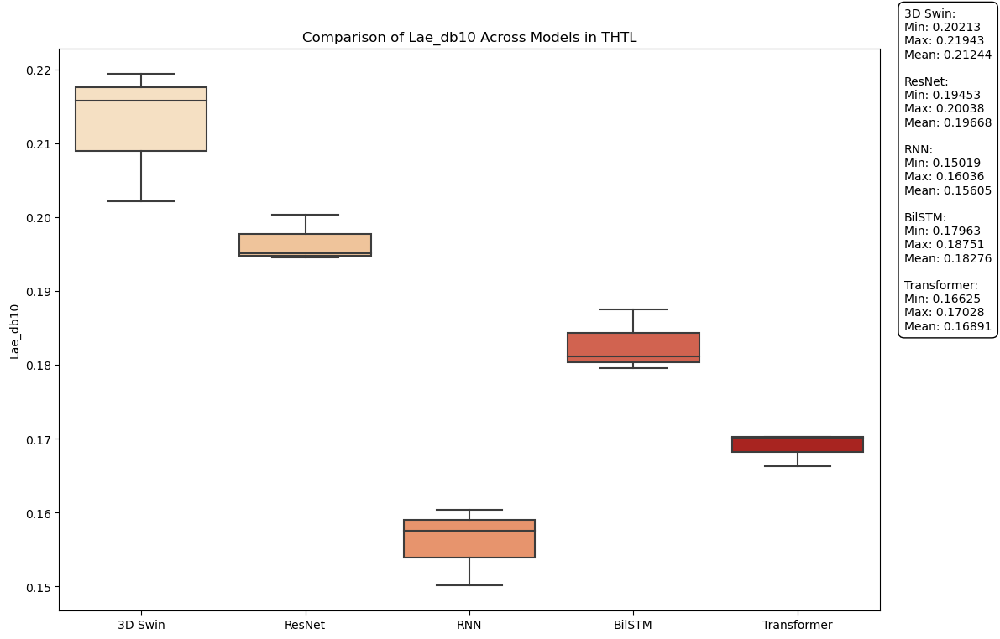

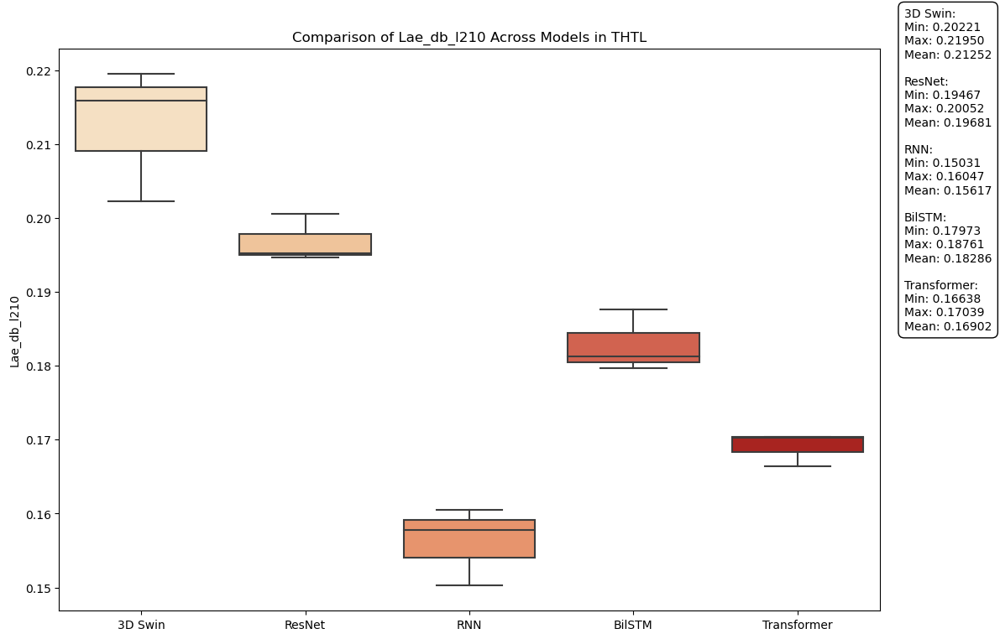

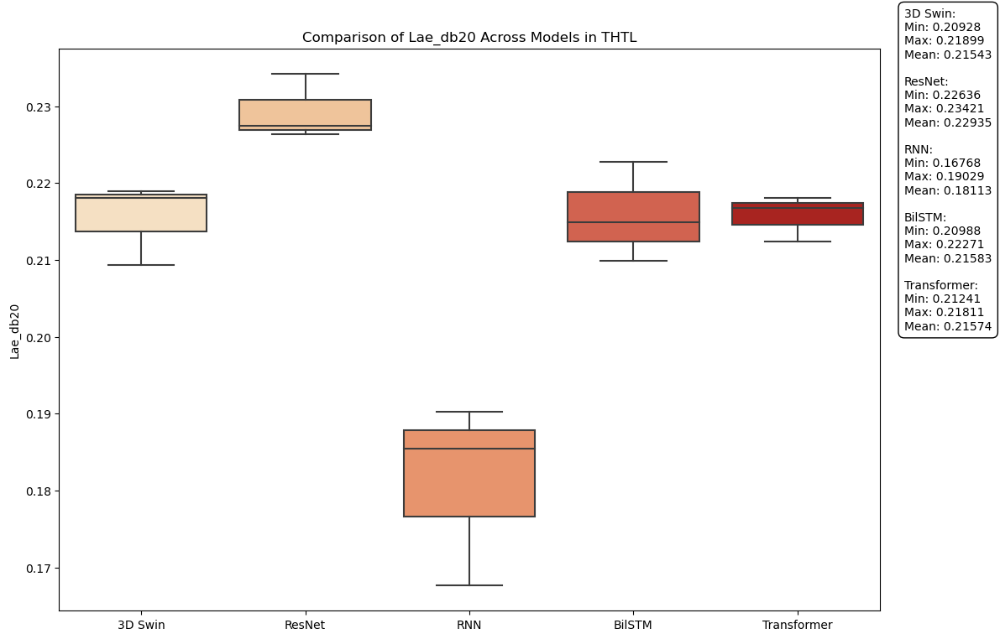

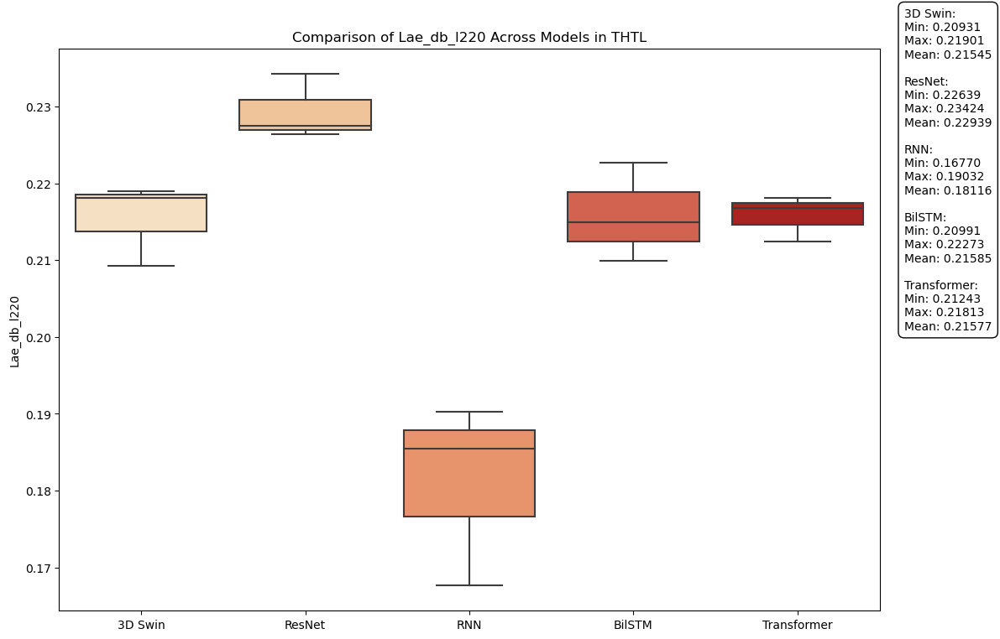

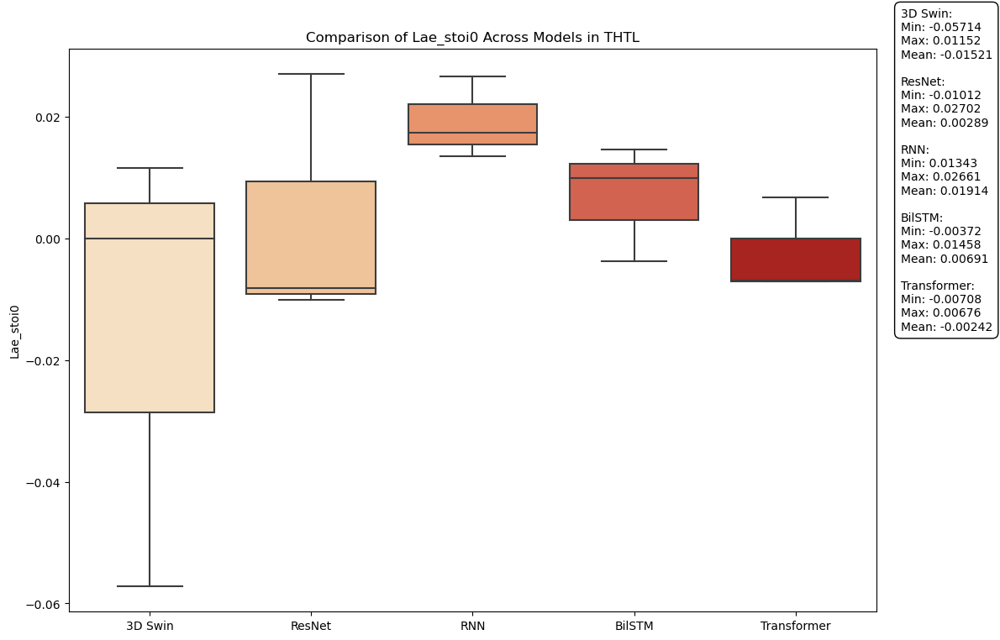

...

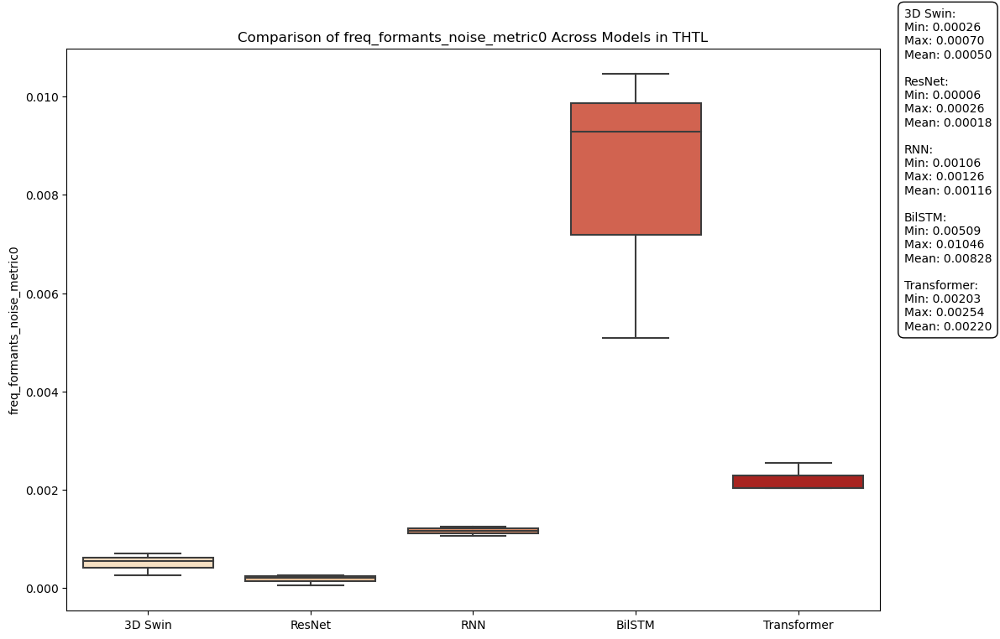

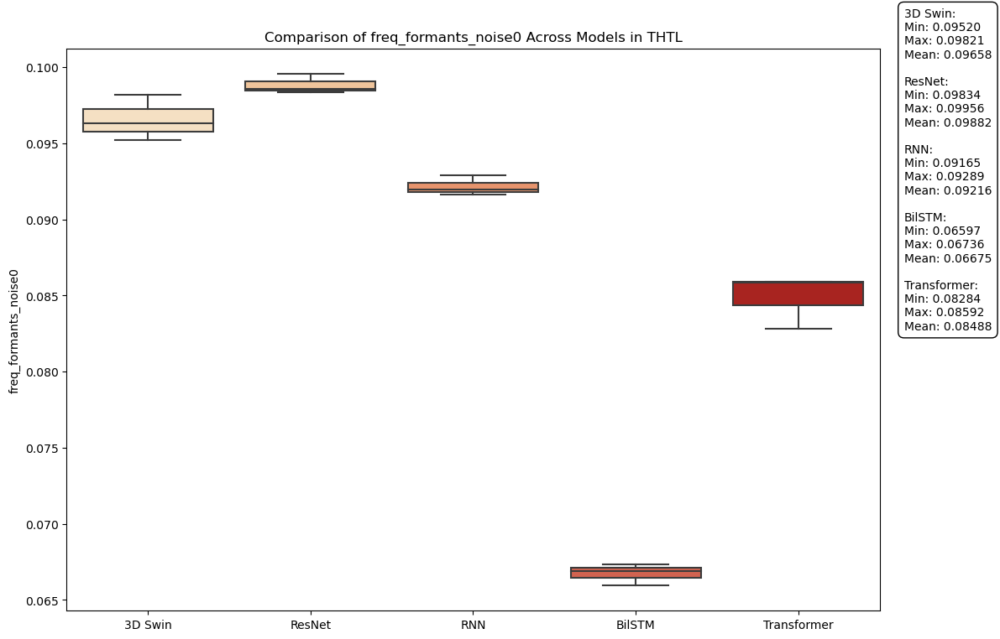

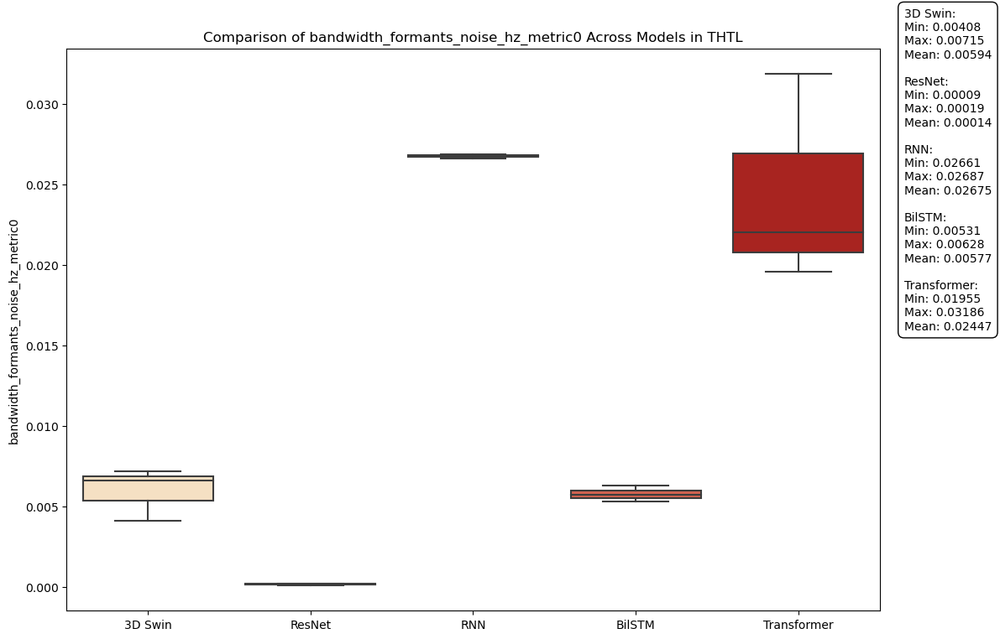

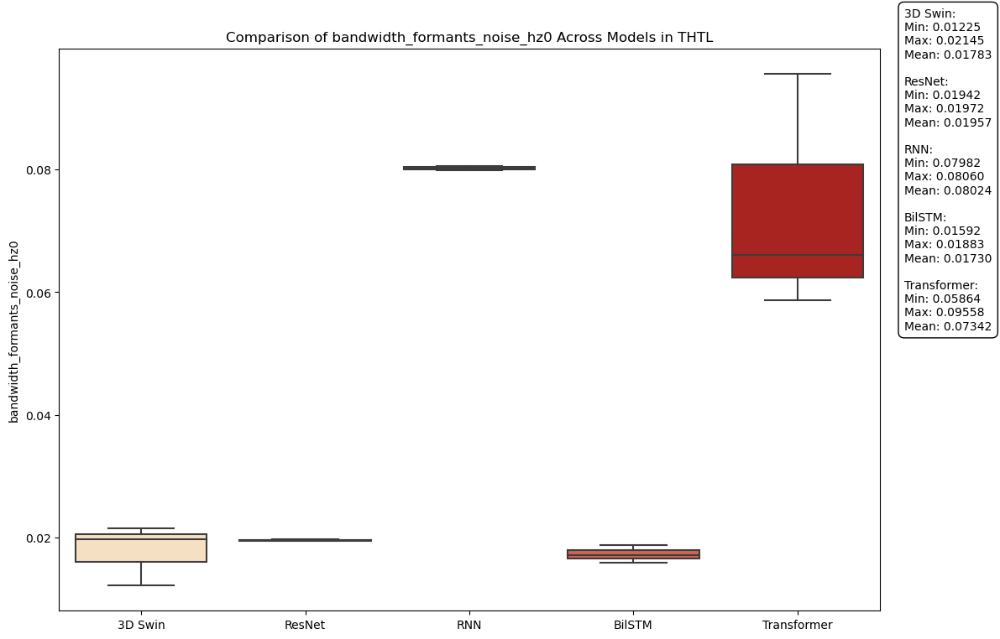

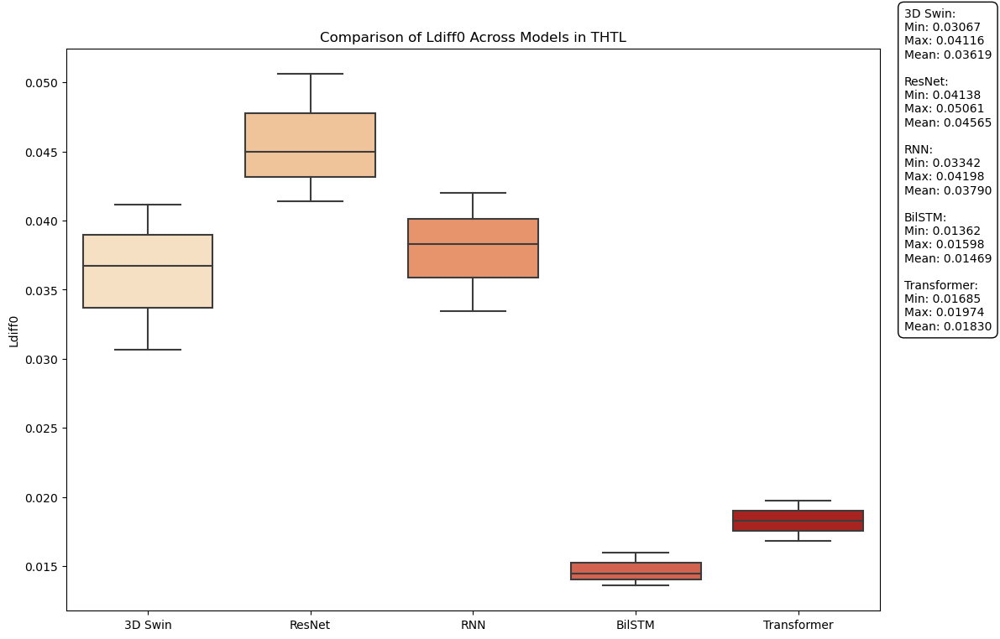

Plots saved to ./picture/THTL


In [14]:
#专用出图
#'Lae_a10', 'Lae_a_l210','Lae_a20', 'Lae_a_l220','Lexp0' 都为0所以不分析
metrics = [
    'Lae_db10', 'Lae_db_l210',
    'Lae_db20', 'Lae_db_l220', 'Lae_stoi0', 'Lrec0', 'loudness_metric0', 
    'loudness0', 'f0_metric0', 'f0_hz0', 'amplitudes_metric0', 'amplitudes0',
    'amplitude_formants_hamon_metric0', 'amplitude_formants_hamon0',
    'freq_formants_hamon_hz_metric_20', 'freq_formants_hamon_hz_metric_60',
    'freq_formants_hamon0', 'amplitude_formants_noise_metric0', 'amplitude_formants_noise0',
    'freq_formants_noise_metric0', 'freq_formants_noise0', 
    'bandwidth_formants_noise_hz_metric0', 'bandwidth_formants_noise_hz0',
    'Ldiff0']

# Define the custom labels for each metric
labels = ['3D Swin', 'ResNet', 'RNN','BilSTM','Transformer']
colors = sns.color_palette('OrRd', len(labels))  # Use a color palette with enough colors
color_map = dict(zip(labels, colors))
output_dir = './picture/THTL'
os.makedirs(output_dir, exist_ok=True)

for metric in metrics:
    # Create a DataFrame suitable for seaborn
    data = [dfs[j][metric].dropna() for j in range(5)]  # Drop NA values
    df = pd.DataFrame({
        'Model': np.concatenate([np.full_like(data[j], labels[j], dtype=object) for j in range(5)]),
        'Value': np.concatenate(data)
    })

    plt.figure(figsize=(12, 8))  
    sns.boxplot(x='Model', y='Value', data=df, palette=color_map)
    
    stats_text = []
    for j, label in enumerate(labels):
        model_data = df[df['Model'] == label]['Value']
        if len(model_data) > 0:  # Ensure there is data to compute statistics
            min_val = np.min(model_data)
            max_val = np.max(model_data)
            mean_val = np.mean(model_data)
            stats_text.append(f'{label}:\nMin: {min_val:.5f}\nMax: {max_val:.5f}\nMean: {mean_val:.5f}')
    
    stats_str = "\n\n".join(stats_text)
    plt.annotate(stats_str, xy=(1.03, 0.5), xycoords='axes fraction',
                 fontsize=10, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))
    
    plt.title(f'Comparison of {metric} Across Models in THTL')
    plt.ylabel(metric)
    plt.xlabel('')  # Remove x-axis label for cleaner look
    # Save the figure to a file
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f'{metric}_THTL.png'))
    plt.show()
    plt.close()  # Close the figure to avoid display

print(f'Plots saved to {output_dir}')


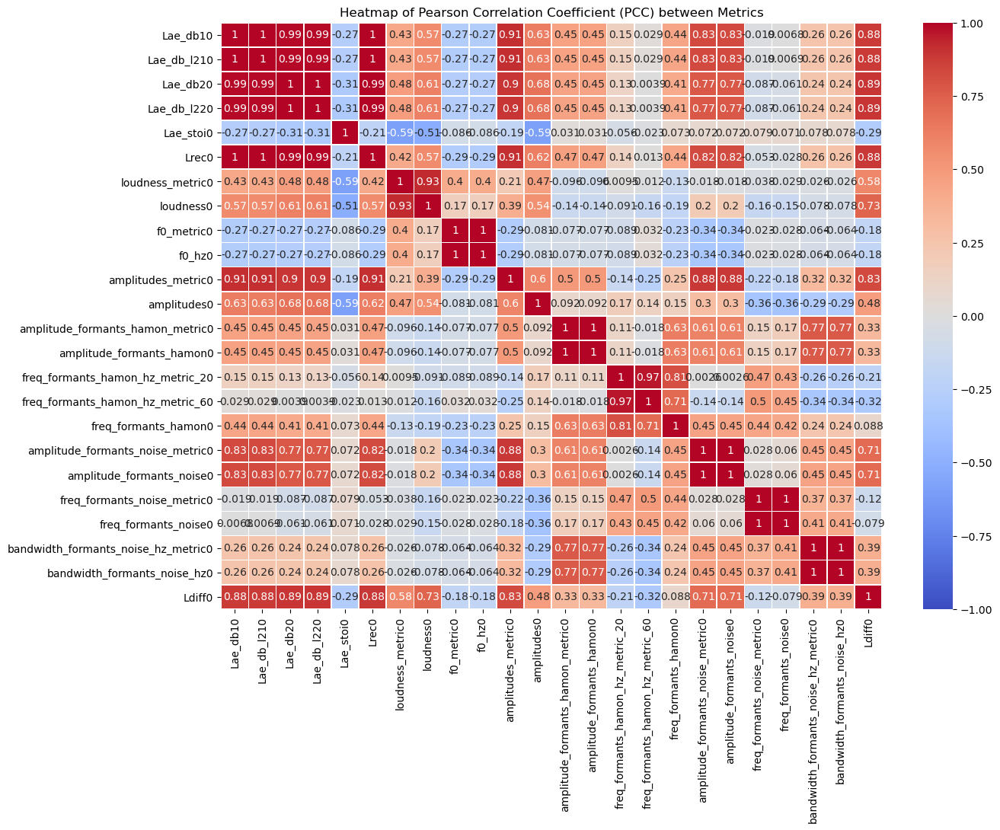

In [12]:
metrics = [
    'Lae_db10', 'Lae_db_l210', 'Lae_db20', 'Lae_db_l220', 'Lae_stoi0', 'Lrec0', 'loudness_metric0', 
    'loudness0', 'f0_metric0', 'f0_hz0', 'amplitudes_metric0', 'amplitudes0', 
    'amplitude_formants_hamon_metric0', 'amplitude_formants_hamon0',
    'freq_formants_hamon_hz_metric_20', 'freq_formants_hamon_hz_metric_60',
    'freq_formants_hamon0', 'amplitude_formants_noise_metric0', 'amplitude_formants_noise0',
    'freq_formants_noise_metric0', 'freq_formants_noise0', 
    'bandwidth_formants_noise_hz_metric0', 'bandwidth_formants_noise_hz0',
    'Ldiff0'
]
combined_df = pd.concat(dfs, keys=['3D Swin', 'ResNet', 'RNN','BilSTM','Transformer'])
pcc_matrix = combined_df[metrics].corr()
output_dir = './picture'
plt.figure(figsize=(14, 10))
sns.heatmap(pcc_matrix, annot=True, cmap="coolwarm", vmin=-1, vmax=1, linewidths=.5)
plt.title("Heatmap of Pearson Correlation Coefficient (PCC) between Metrics")
plt.savefig(os.path.join(output_dir, 'Heatmap PPC.png'))
plt.show()

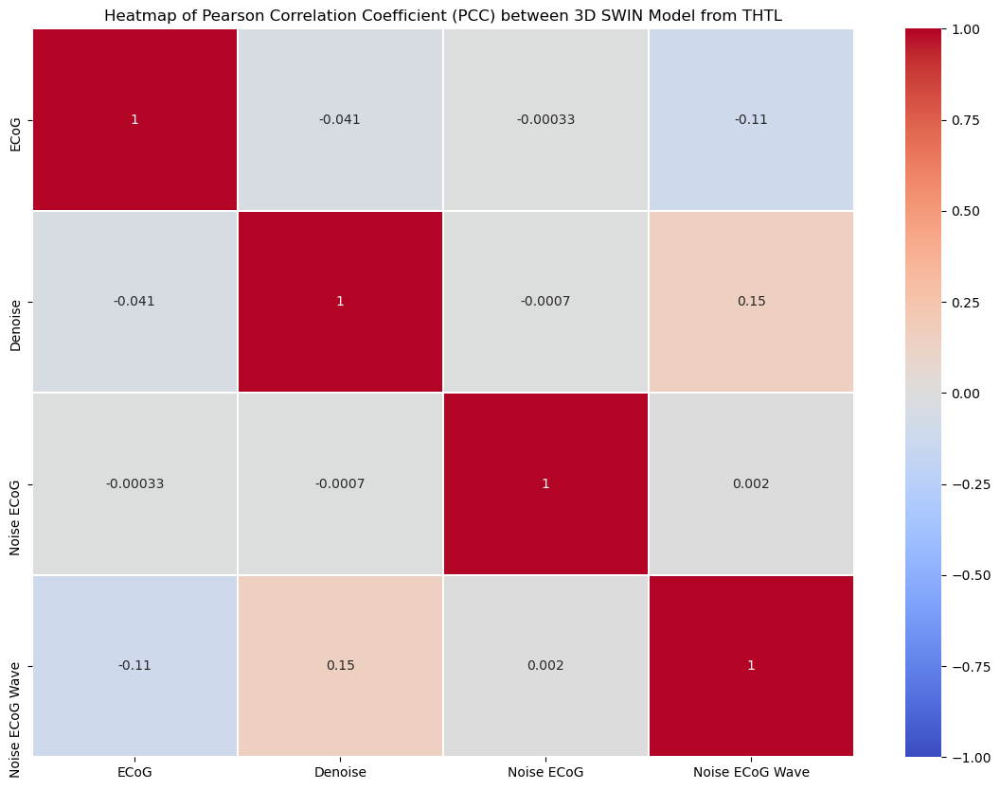

In [8]:
file1_path = './output/e2a/HB02_3DSWIN_THTL/sample_21_LD20221104.pngecog.wav'
file2_path = './output/e2a/HB02_3DSWIN_THTL/sample_21_LD20221104.pngdenoise.wav'
file3_path = './output/e2a/HB02_3DSWIN_THTL/sample_21_LD20221104.pngdenoiseecog.wav'
file4_path = './output/e2a/HB02_3DSWIN_THTL/sample_21_LD20221104.pngdenoiseecogwave.wav'
rate1, data1 = wav.read(file4_path)
rate2, data2 = wav.read(file1_path)
rate3, data3 = wav.read(file2_path)
rate4, data4 = wav.read(file3_path)
min_length = min(len(data1), len(data2), len(data3), len(data4))
labels = [
    "ECoG",
    "Denoise",
    "Noise ECoG",
    "Noise ECoG Wave"
]
data1 = data1[:min_length]
data2 = data2[:min_length]
data3 = data3[:min_length]
data4 = data4[:min_length]

pcc_matrix = np.corrcoef([data1, data2, data3, data4])
output_dir = './picture/THTL'
plt.figure(figsize=(14, 10))
sns.heatmap(pcc_matrix, annot=True, cmap="coolwarm", vmin=-1, vmax=1, linewidths=.5, xticklabels=labels, yticklabels=labels)
plt.title("Heatmap of Pearson Correlation Coefficient (PCC) between 3D SWIN Model from THTL")
plt.savefig(os.path.join(output_dir, 'Heatmap PPC 3D SWIN THTL.png'))
plt.show()

Spectrum of model 3D Swin and original audio PCC: 0.03982949738385467
Spectrum of model ResNet and original audio PCC: 0.0653834473660018
Spectrum of model RNN and original audio PCC: 0.031196401055943866
Spectrum of model BilSTM and original audio PCC: 0.008263522192849074
Spectrum of model Transformer and original audio PCC: 0.08042148373541688


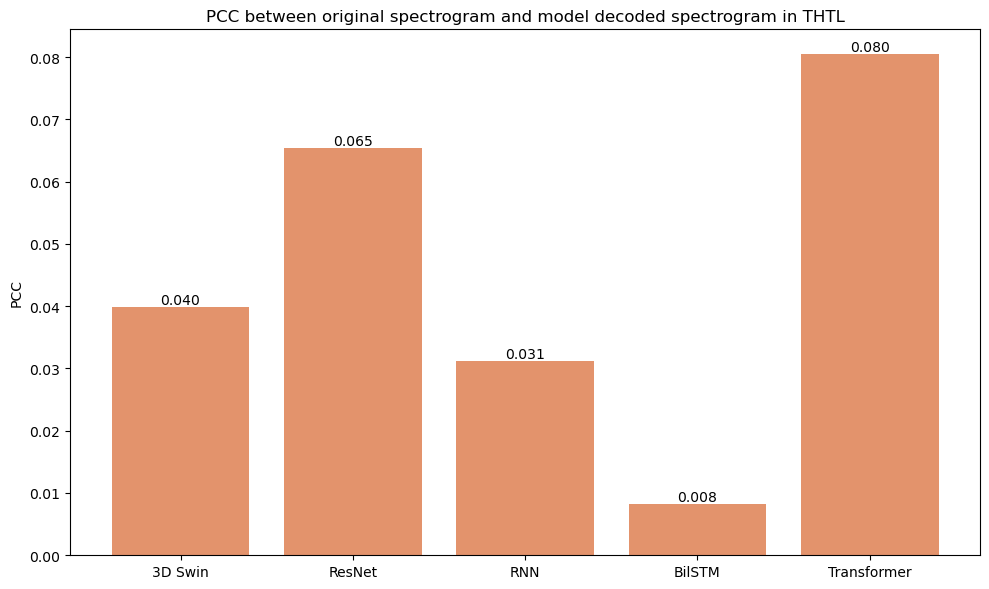

In [38]:
original_file = "./example_data/HB02.wav"
decoded_folders = [
    "./output/e2a/HB02_3DSWIN_THTL/",
    "./output/e2a/HB02_RESNET_THTL/",
    "./output/e2a/HB02_RNN_THTL/",
    "./output/e2a/HB02_BILSTM_THTL/",
    "./output/e2a/HB02_TRANS_THTL/"
]
rate_orig, data_orig = wavfile.read(original_file)
decoded_file_name = "sample_21_LD20221104.pngdenoiseecogwave.wav"
model_names = ['3D Swin', 'ResNet', 'RNN', 'BilSTM', 'Transformer']
pcc_results = []

for i, folder in enumerate(decoded_folders):
    decoded_file = os.path.join(folder, decoded_file_name)
    rate_decoded, data_decoded = wavfile.read(decoded_file)
    min_length = min(len(data_orig), len(data_decoded))
    data_orig_trimmed = data_orig[:min_length]
    data_decoded_trimmed = data_decoded[:min_length]
    
    f_orig, t_orig, Sxx_orig = spectrogram(data_orig_trimmed, rate_orig)
    f_decoded, t_decoded, Sxx_decoded = spectrogram(data_decoded_trimmed, rate_decoded)

    Sxx_orig_flat = Sxx_orig.flatten()
    Sxx_decoded_flat = Sxx_decoded.flatten()
    pcc, _ = pearsonr(Sxx_orig_flat, Sxx_decoded_flat)
    model_name = model_names[i]
    pcc_results.append((model_name, pcc))
    print(f"Spectrum of model {model_name} and original audio PCC: {pcc}")
    
models, pcc_values = zip(*pcc_results)
plt.figure(figsize=(10, 6))
bars = plt.bar(models, pcc_values, color='#e3936c')
for bar, value in zip(bars, pcc_values):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), 
             f'{value:.3f}', ha='center', va='bottom', color='black', fontsize=10)
plt.ylabel('PCC')
plt.title('PCC between original spectrogram and model decoded spectrogram in THTL')
plt.tight_layout()
output_dir = './picture/THTL'
plt.savefig(os.path.join(output_dir, 'Comparison of PCC among models_THTL.png'))
# 显示图表
plt.show()

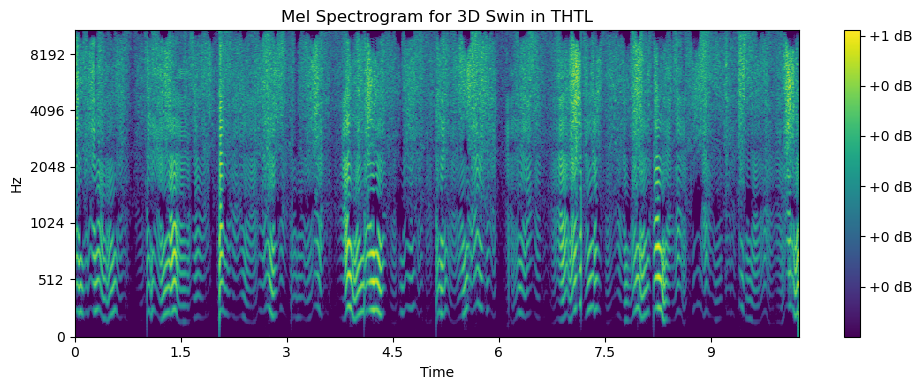

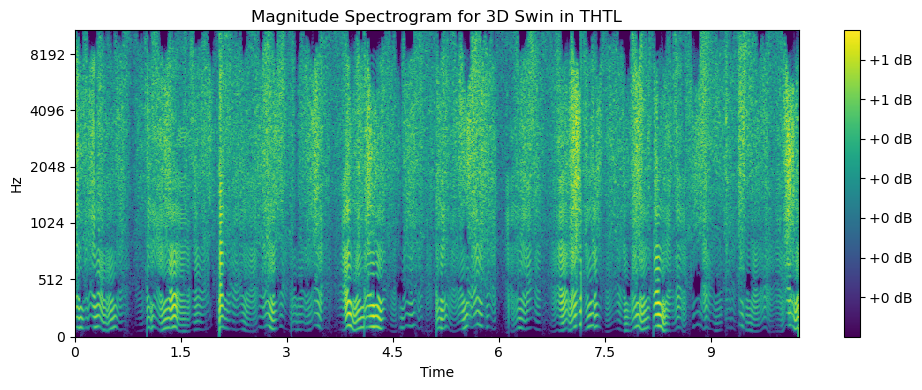

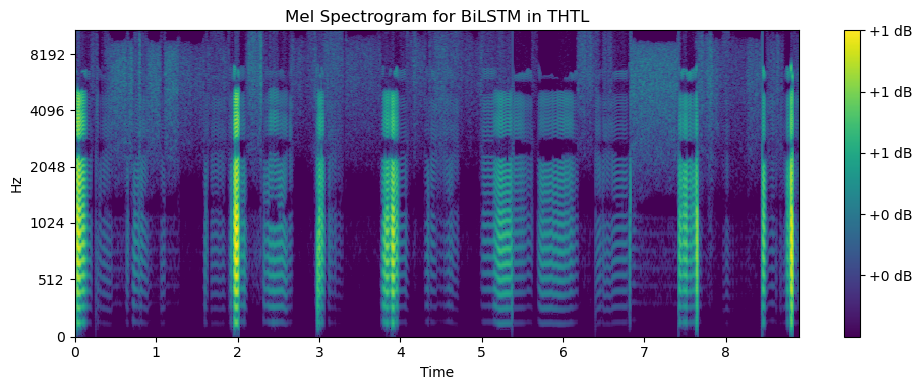

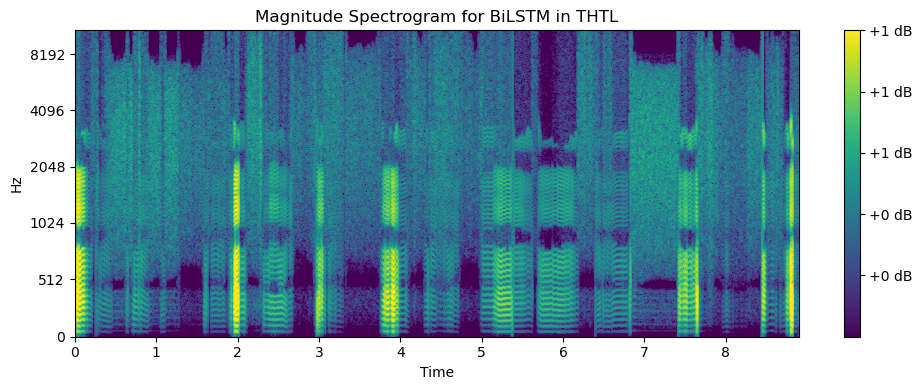

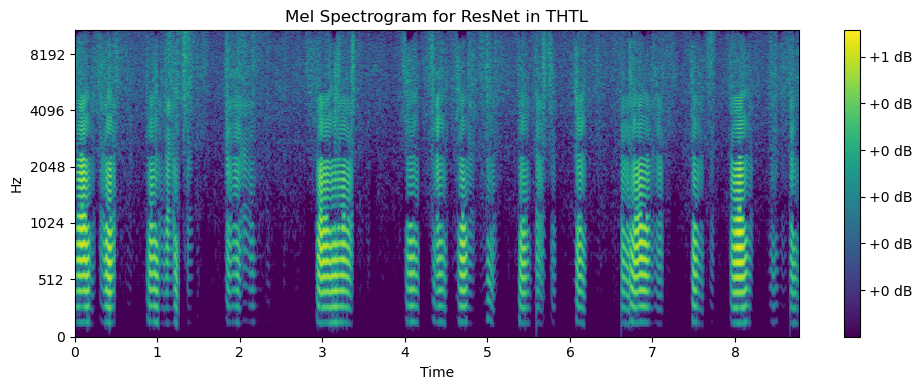

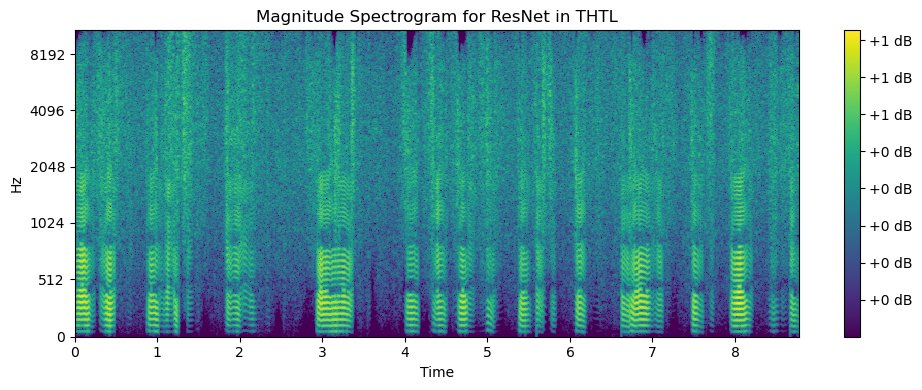

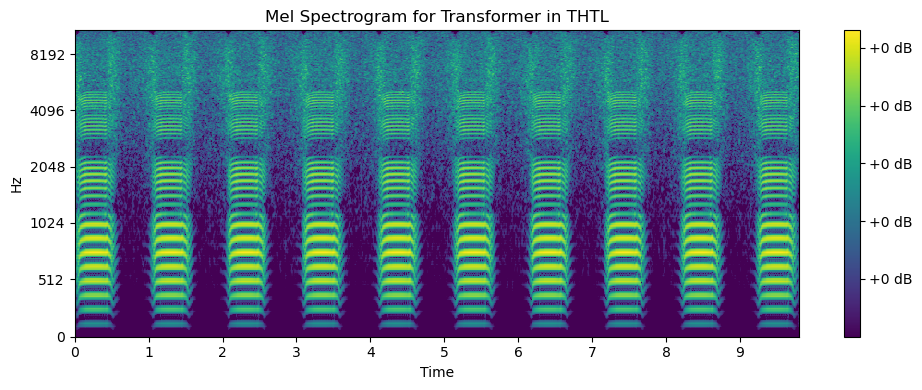

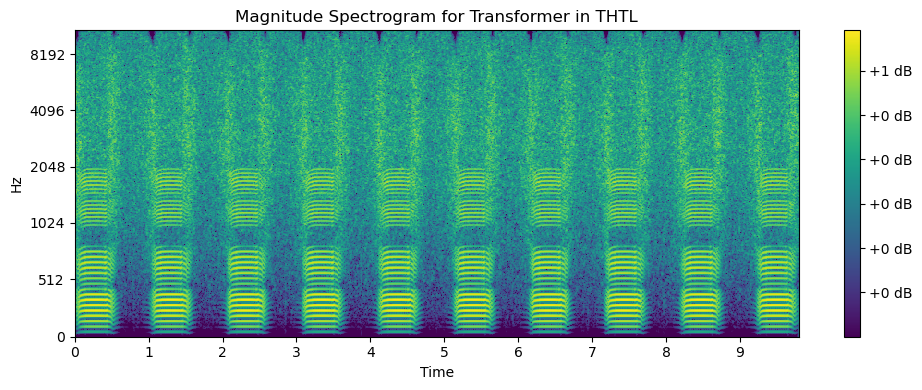

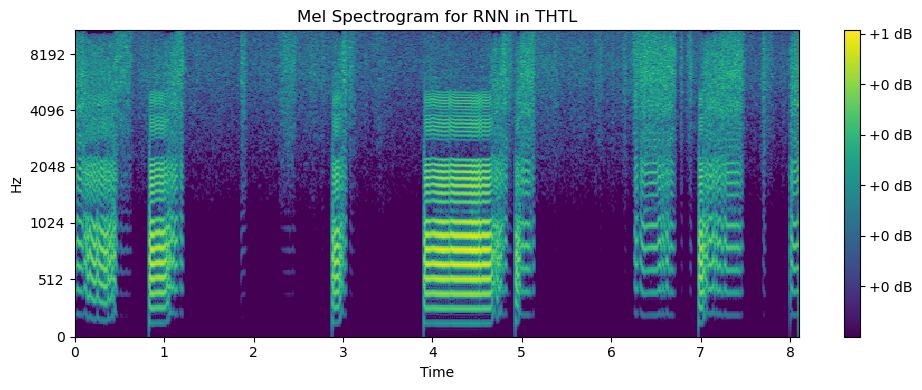

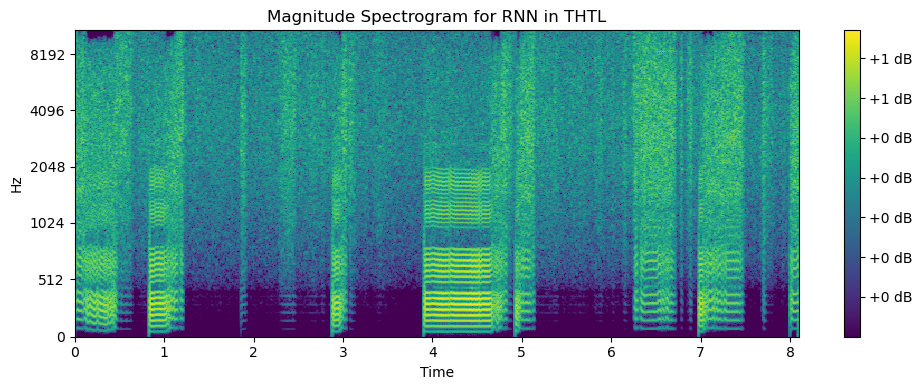

In [70]:
sr = 16000               # Sample rate
n_fft = 2048             # Number of FFT points
frame_shift = 0.0125     # Frame shift in seconds
frame_length = 0.05      # Frame length in seconds
hop_length = int(sr * frame_shift)  # Number of samples per frame shift
win_length = int(sr * frame_length) # Number of samples per frame length
n_mels = 512             # Number of Mel bands to generate
power = 1.2              # Exponent for amplifying the predicted magnitude
n_iter = 100             # Number of inversion iterations
preemphasis = 0.97       # Pre-emphasis filter coefficient, or None
max_db = 100             # Maximum decibel value
ref_db = 20              # Reference decibel value
top_db = 15              # Threshold for trimming silence

def get_spectrograms(fpath,sr):
    y, sr = librosa.load(fpath, sr=sr)
    y, _ = librosa.effects.trim(y, top_db=top_db)
    y = np.append(y[0], y[1:] - preemphasis * y[:-1])
    linear = librosa.stft(y=y, n_fft=n_fft, hop_length=hop_length, win_length=win_length)
    mag = np.abs(linear)  # (1+n_fft//2, T)
    mel_basis = librosa.filters.mel(sr, n_fft, n_mels)  # (n_mels, 1+n_fft//2)
    mel = np.dot(mel_basis, mag)  # (n_mels, T)
    mel = 20 * np.log10(np.maximum(1e-5, mel))
    mag = 20 * np.log10(np.maximum(1e-5, mag))
    mel = np.clip((mel - ref_db + max_db) / max_db, 1e-8, 1)
    mag = np.clip((mag - ref_db + max_db) / max_db, 1e-8, 1)
    mel = mel.T.astype(np.float32)  # (T, n_mels)
    mag = mag.T.astype(np.float32)  # (T, 1+n_fft//2)
    return mel, mag

def plot_spectrogram(spectrogram, title, sr, hop_length, output_dir, file_name):
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(spectrogram, sr=sr, hop_length=hop_length, x_axis='time', y_axis='mel', cmap = 'viridis')
    plt.colorbar(format='%+2.0f dB')
    plt.title(title)
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, file_name))
    plt.show()
    plt.close()
labels = ['3D Swin', 'BiLSTM', 'ResNet', 'Transformer', 'RNN']
audio_file = [
    './output/e2a/HB02_3DSWIN_THTL/sample_21_LD20221104.pngdenoiseecogwave.wav',
    './output/e2a/HB02_BILSTM_THTL/sample_21_LD20221104.pngdenoiseecogwave.wav',
    './output/e2a/HB02_RESNET_THTL/sample_21_LD20221104.pngdenoiseecogwave.wav',
    './output/e2a/HB02_TRANS_THTL/sample_21_LD20221104.pngdenoiseecogwave.wav',
    './output/e2a/HB02_RNN_THTL/sample_21_LD20221104.pngdenoiseecogwave.wav',
]  
output_dir = "./picture/THTL"
for i, file_path in enumerate(audio_file):
    label = labels[i]
    mel_spectrogram, magnitude_spectrogram = get_spectrograms(file_path, sr)
    plot_spectrogram(mel_spectrogram.T, f'Mel Spectrogram for {label} in THTL', sr, hop_length, output_dir, f'{label}_mel_spectrogram_THTL.png')
    plot_spectrogram(magnitude_spectrogram.T, f'Magnitude Spectrogram for {label} in THTL', sr, hop_length, output_dir, f'{label}_magnitude_spectrogram_THTL.png')

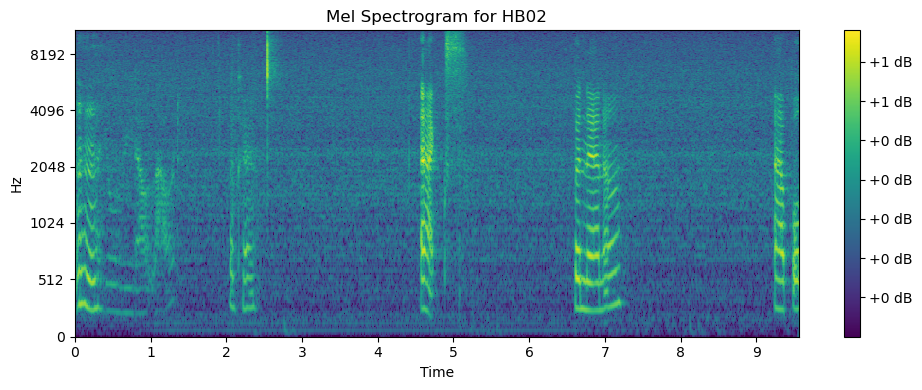

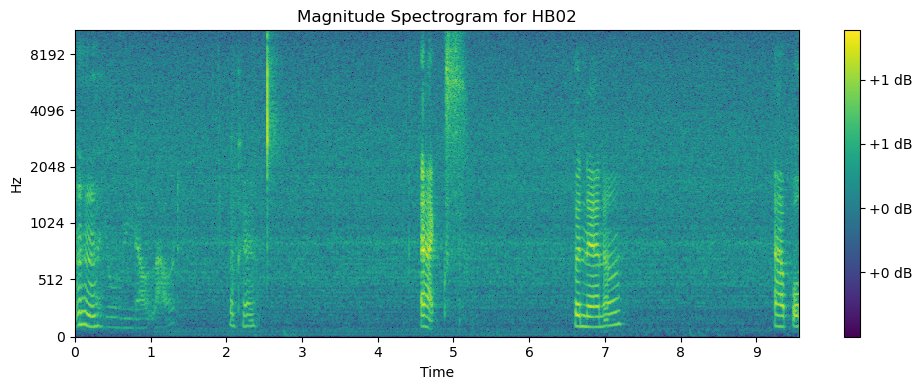

In [83]:
sr = 16000               # Sample rate
n_fft = 2048             # Number of FFT points
frame_shift = 0.0125     # Frame shift in seconds
frame_length = 0.05      # Frame length in seconds
hop_length = int(sr * frame_shift)  # Number of samples per frame shift
win_length = int(sr * frame_length) # Number of samples per frame length
n_mels = 512             # Number of Mel bands to generate
power = 1.2              # Exponent for amplifying the predicted magnitude
n_iter = 100             # Number of inversion iterations
preemphasis = 0.97       # Pre-emphasis filter coefficient, or None
max_db = 100             # Maximum decibel value
ref_db = 20              # Reference decibel value
top_db = 15              # Threshold for trimming silence
duration = 10

def get_spectrograms(fpath,sr):
    y, sr = librosa.load(fpath, sr=sr,duration = duration)
    y, _ = librosa.effects.trim(y, top_db=top_db)
    y = np.append(y[0], y[1:] - preemphasis * y[:-1])
    linear = librosa.stft(y=y, n_fft=n_fft, hop_length=hop_length, win_length=win_length)
    mag = np.abs(linear)  # (1+n_fft//2, T)
    mel_basis = librosa.filters.mel(sr, n_fft, n_mels)  # (n_mels, 1+n_fft//2)
    mel = np.dot(mel_basis, mag)  # (n_mels, T)
    mel = 20 * np.log10(np.maximum(1e-5, mel))
    mag = 20 * np.log10(np.maximum(1e-5, mag))
    mel = np.clip((mel - ref_db + max_db) / max_db, 1e-8, 1)
    mag = np.clip((mag - ref_db + max_db) / max_db, 1e-8, 1)
    mel = mel.T.astype(np.float32)  # (T, n_mels)
    mag = mag.T.astype(np.float32)  # (T, 1+n_fft//2)
    return mel, mag

def plot_spectrogram(spectrogram, title, sr, hop_length, output_dir, file_name):
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(spectrogram, sr=sr, hop_length=hop_length, x_axis='time', y_axis='mel', cmap = 'viridis')
    plt.colorbar(format='%+2.0f dB')
    plt.title(title)
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, file_name))
    plt.show()
    plt.close()
audio_file = ['./example_data/HB02.wav']  
output_dir = "./picture/THTL"
for i, file_path in enumerate(audio_file):
    label = 'HB02'
    mel_spectrogram, magnitude_spectrogram = get_spectrograms(file_path, sr)
    plot_spectrogram(mel_spectrogram.T, f'Mel Spectrogram for {label}', sr, hop_length, output_dir, f'{label}_mel_spectrogram.png')
    plot_spectrogram(magnitude_spectrogram.T, f'Magnitude Spectrogram for {label}', sr, hop_length, output_dir, f'{label}_magnitude_spectrogram.png')

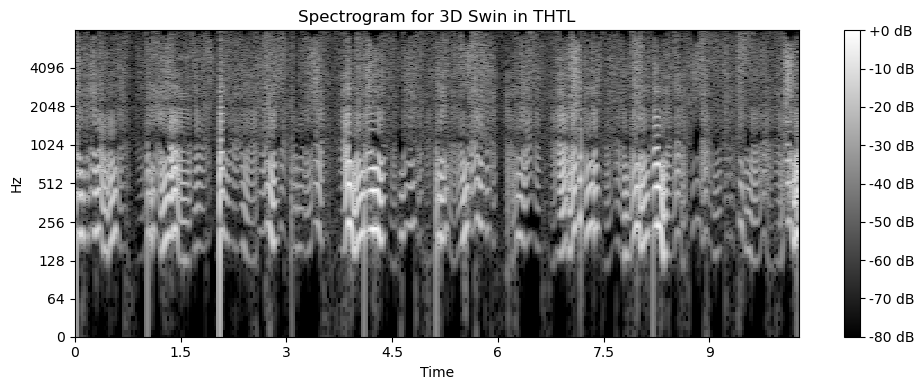

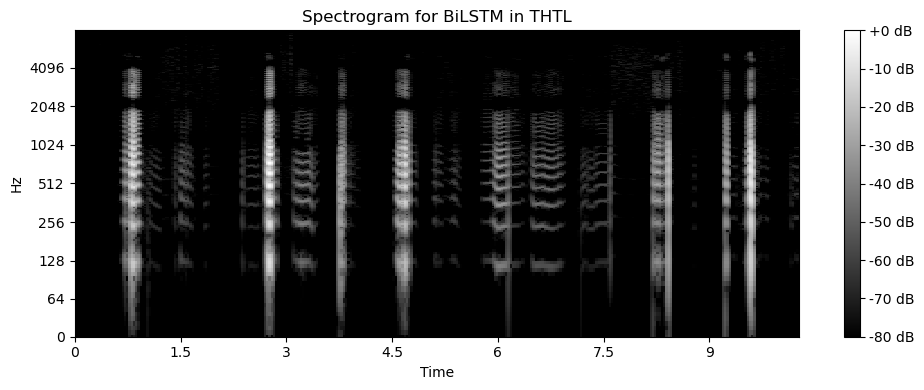

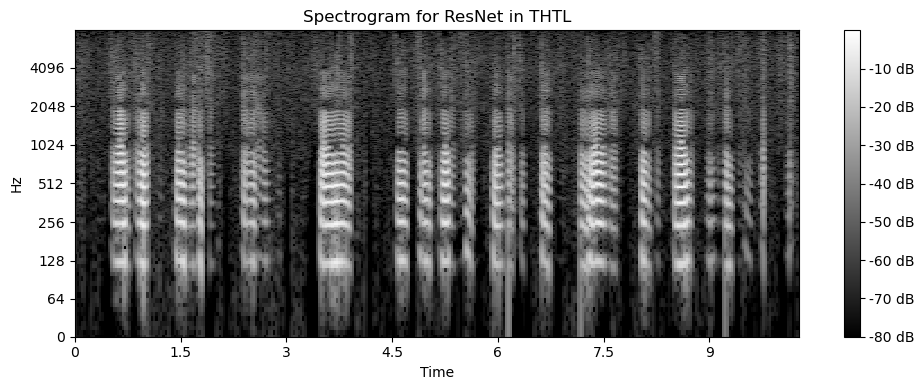

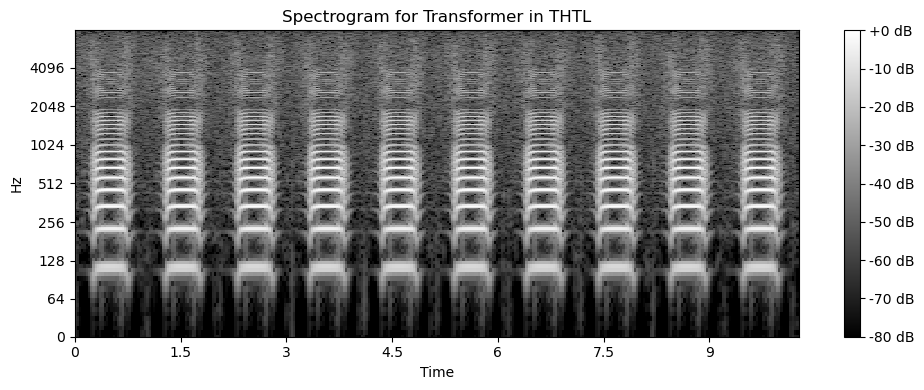

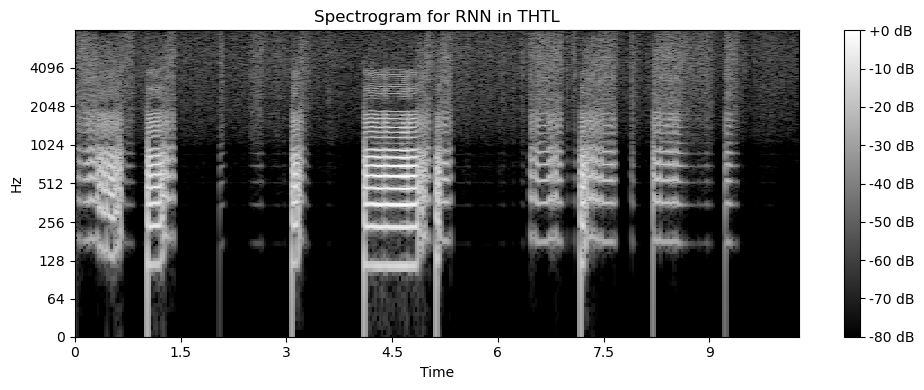

In [76]:
sr = 16000  # Sample rate
n_fft = 2048  # Number of FFT points
hop_length = 512  # Number of samples between frames
n_mels = 32
labels = ['3D Swin', 'BiLSTM', 'ResNet', 'Transformer', 'RNN']
audio_file = [
    './output/e2a/HB02_3DSWIN_THTL/sample_21_LD20221104.pngdenoiseecogwave.wav',
    './output/e2a/HB02_BILSTM_THTL/sample_21_LD20221104.pngdenoiseecogwave.wav',
    './output/e2a/HB02_RESNET_THTL/sample_21_LD20221104.pngdenoiseecogwave.wav',
    './output/e2a/HB02_TRANS_THTL/sample_21_LD20221104.pngdenoiseecogwave.wav',
    './output/e2a/HB02_RNN_THTL/sample_21_LD20221104.pngdenoiseecogwave.wav'
]

output_dir = "./picture/THTL"
def create_and_save_spectrogram(file_path, label, sr, n_fft, hop_length, output_dir):
    y, sr = librosa.load(file_path, sr=sr)
    D = librosa.stft(y, n_fft=n_fft, hop_length=hop_length)
    S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(S_db, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log', cmap = 'gray')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Spectrogram for {label} in THTL')
    plt.tight_layout()
    file_name = f'Spectrogram for {label} in THTL.png'
    plt.savefig(os.path.join(output_dir, file_name))
    plt.show()
    plt.close()  

for i, file_path in enumerate(audio_file):
    label = labels[i]
    create_and_save_spectrogram(file_path, label, sr, n_fft, hop_length, output_dir)

# TLTH

In [15]:
file_paths = [
    './output/e2a/HB02_3DSWIN_TLTH/epoch_log_test.csv', 
    './output/e2a/HB02_BILSTM_TLTH/epoch_log_test.csv', 
    './output/e2a/HB02_RESNET_TLTH/epoch_log_test.csv',
    './output/e2a/HB02_RNN_TLTH/epoch_log_test.csv',  
    './output/e2a/HB02_TRANS_TLTH/epoch_log_test.csv',
]
dfs = [pd.read_csv(file_path) for file_path in file_paths]
#dfs[0].head(), dfs[1].head(), dfs[2].head(), dfs[3].head()

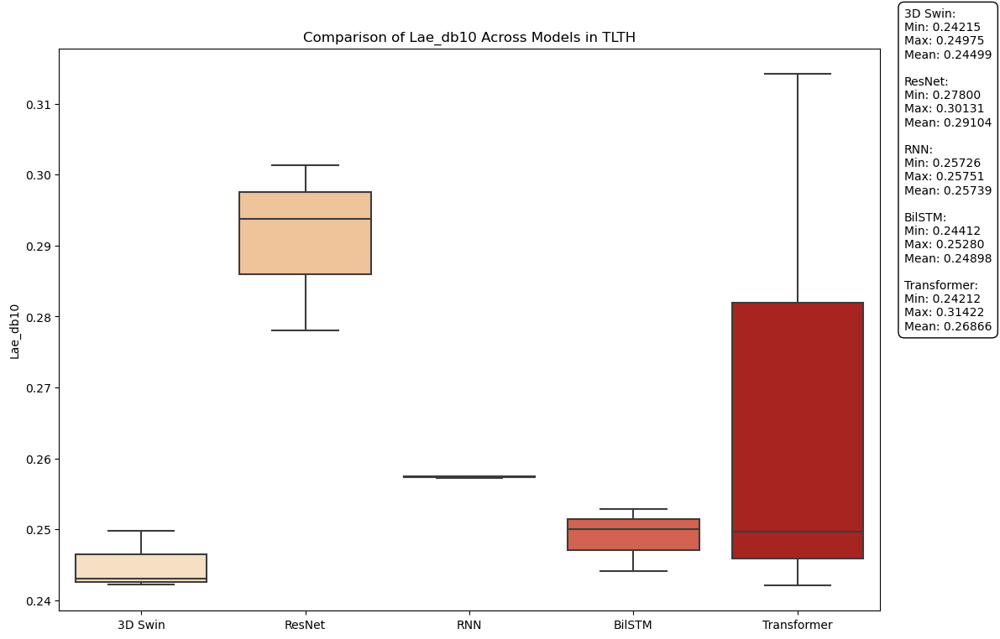

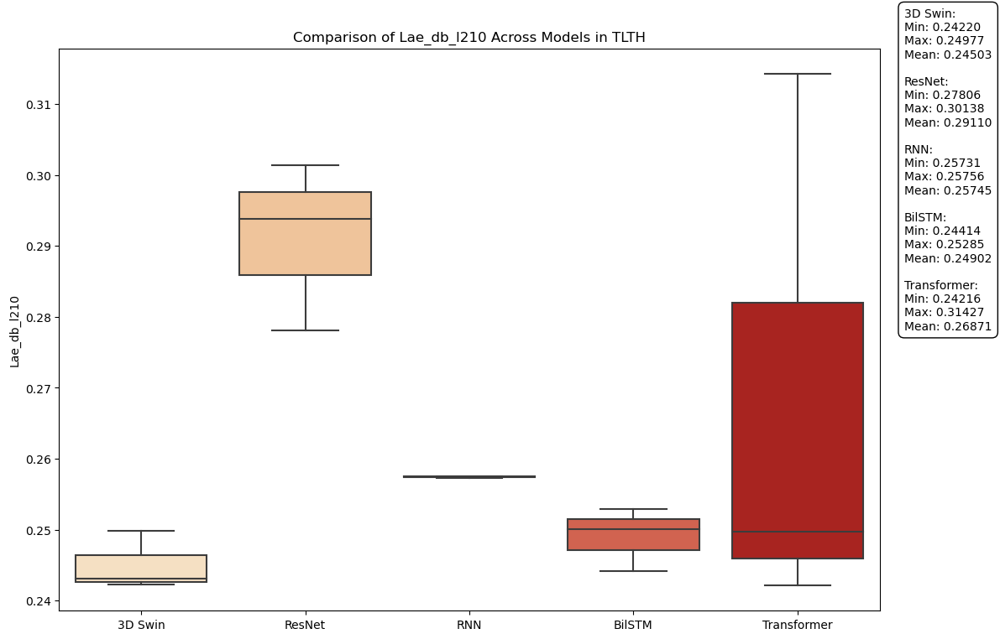

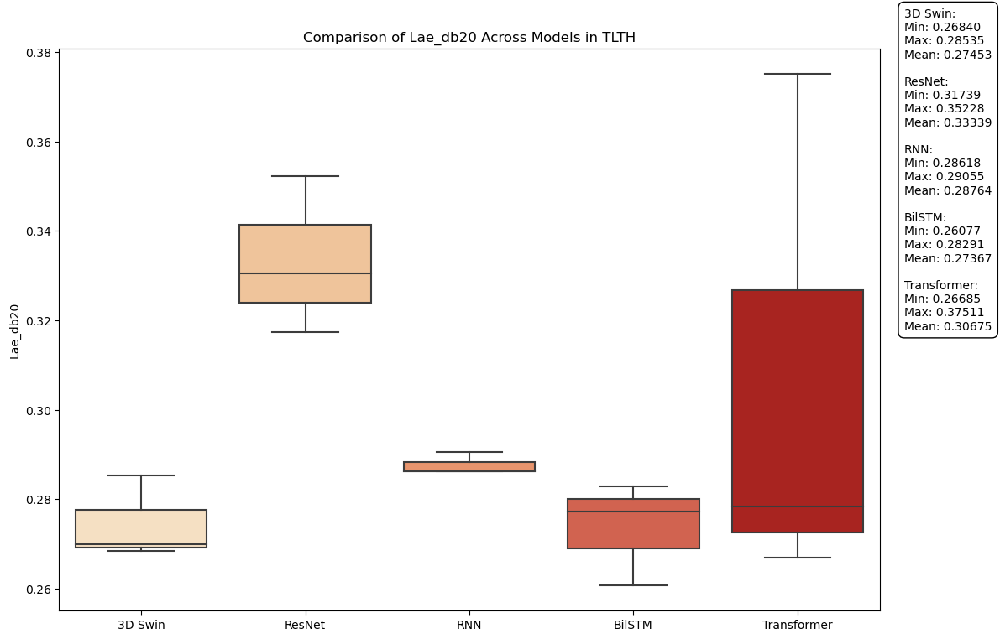

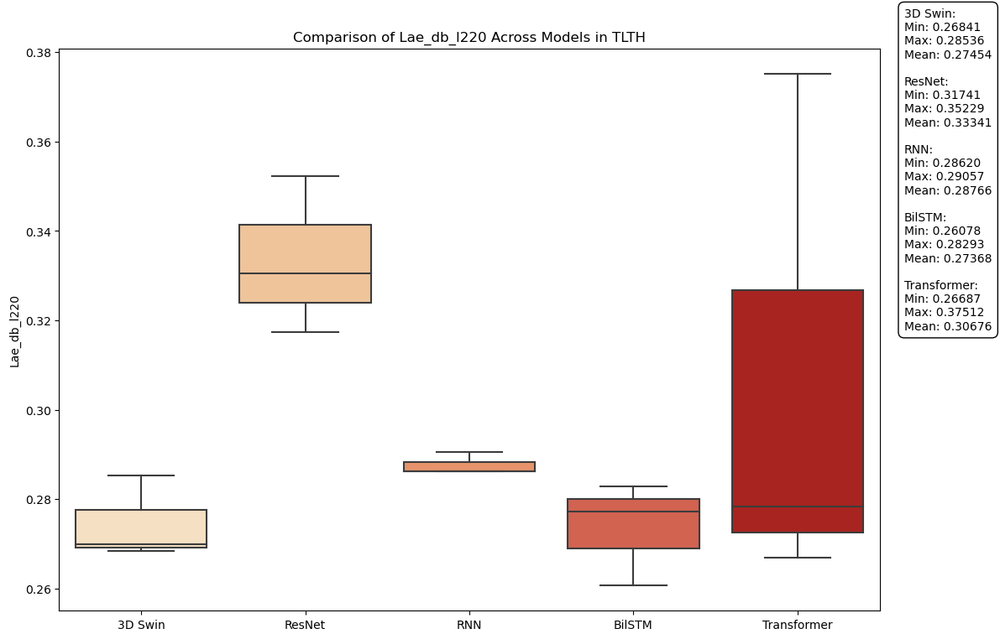

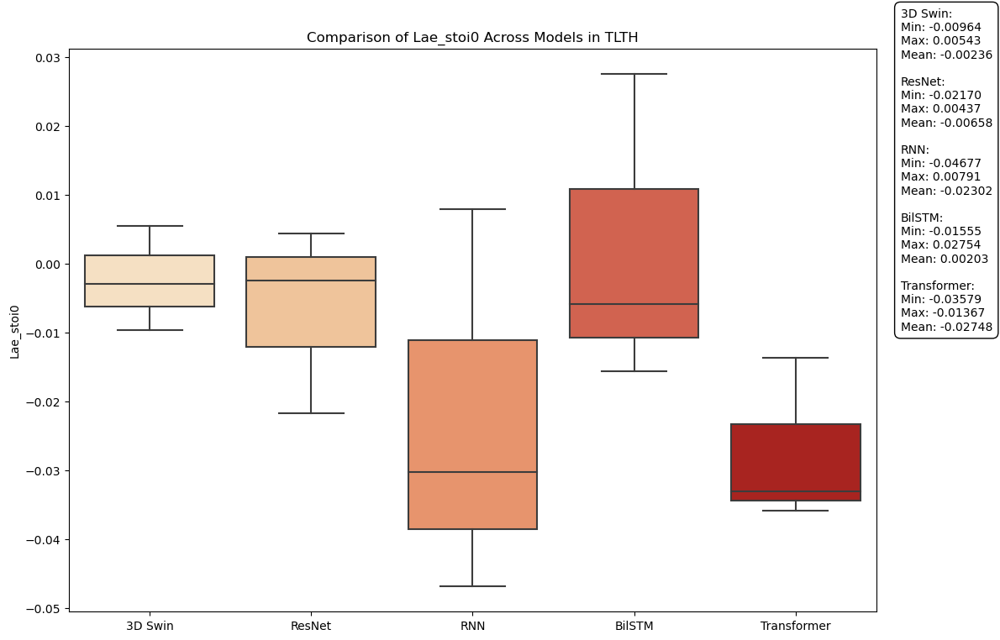

...

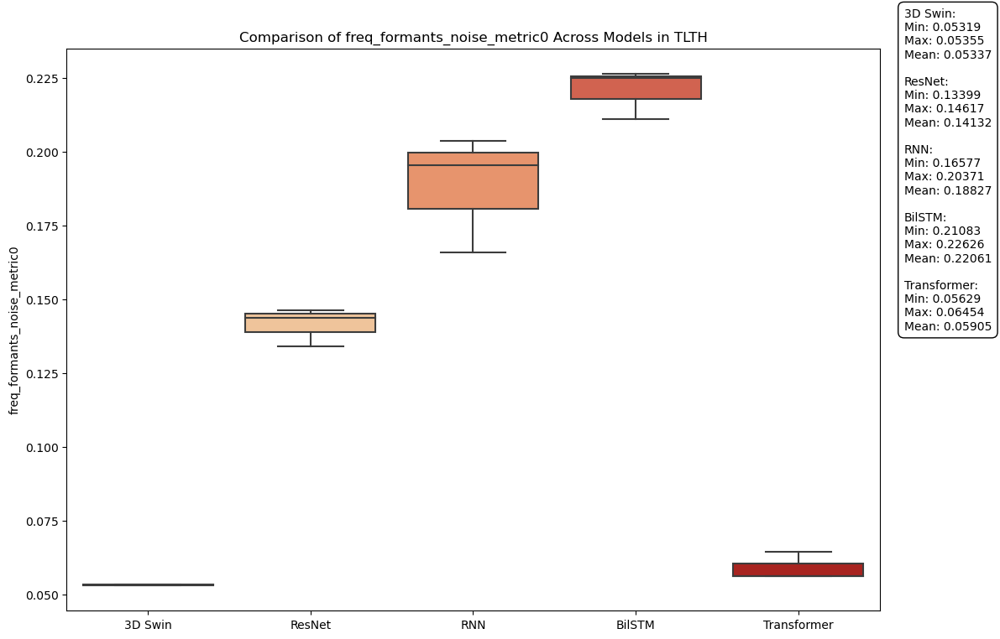

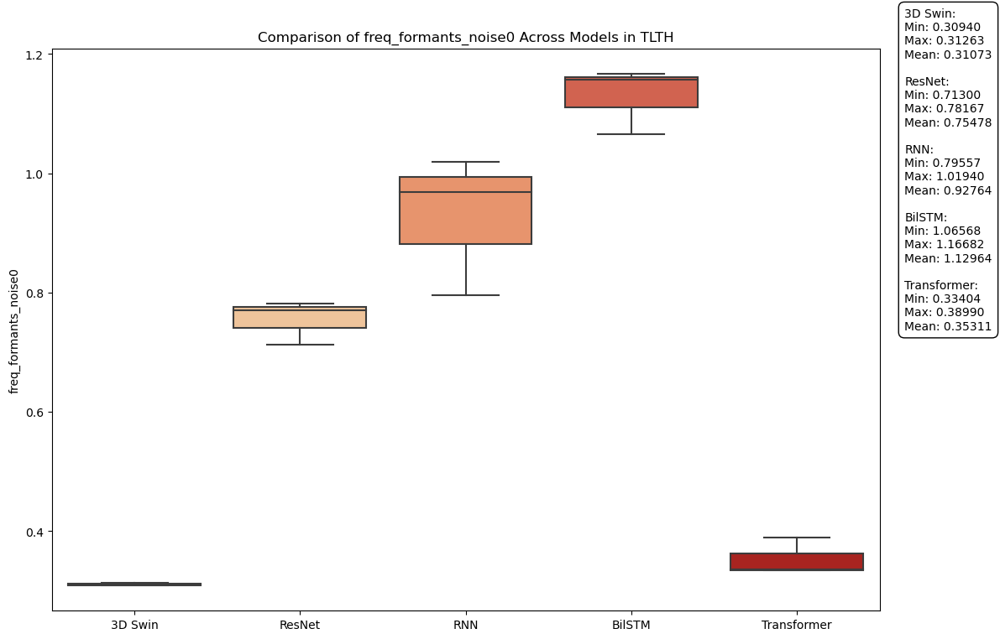

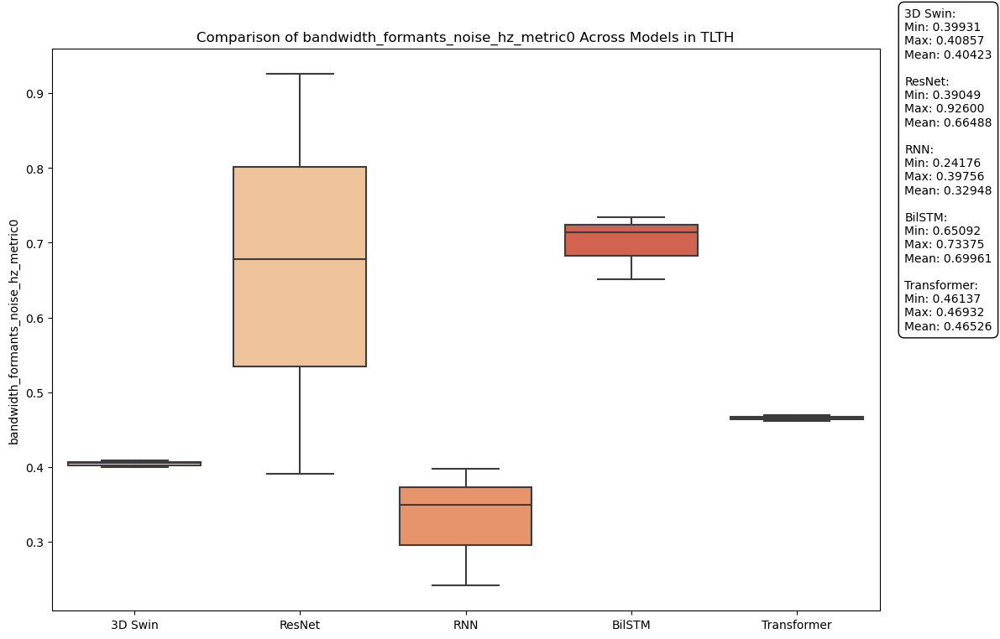

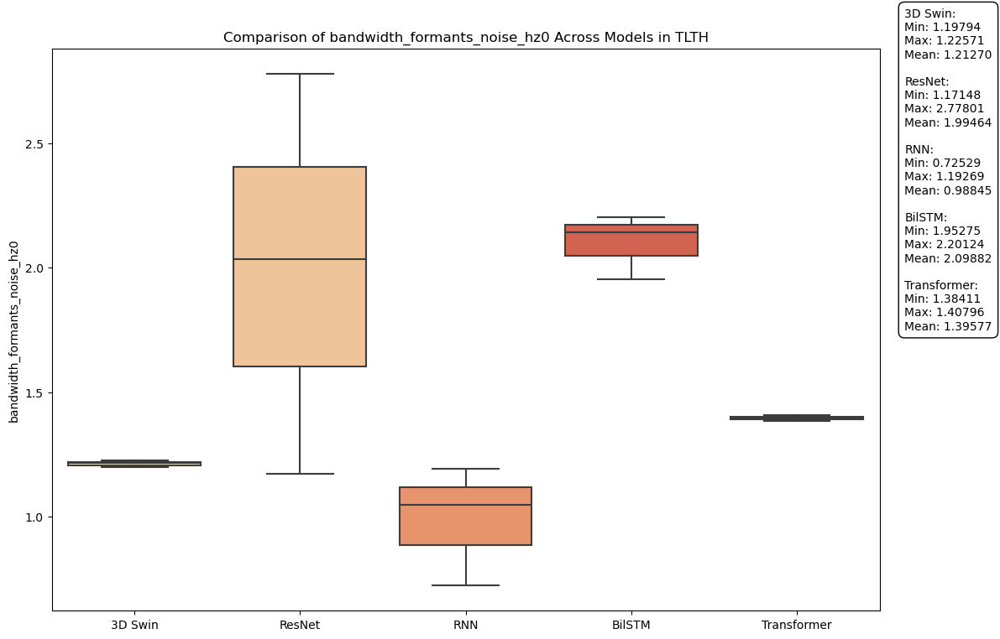

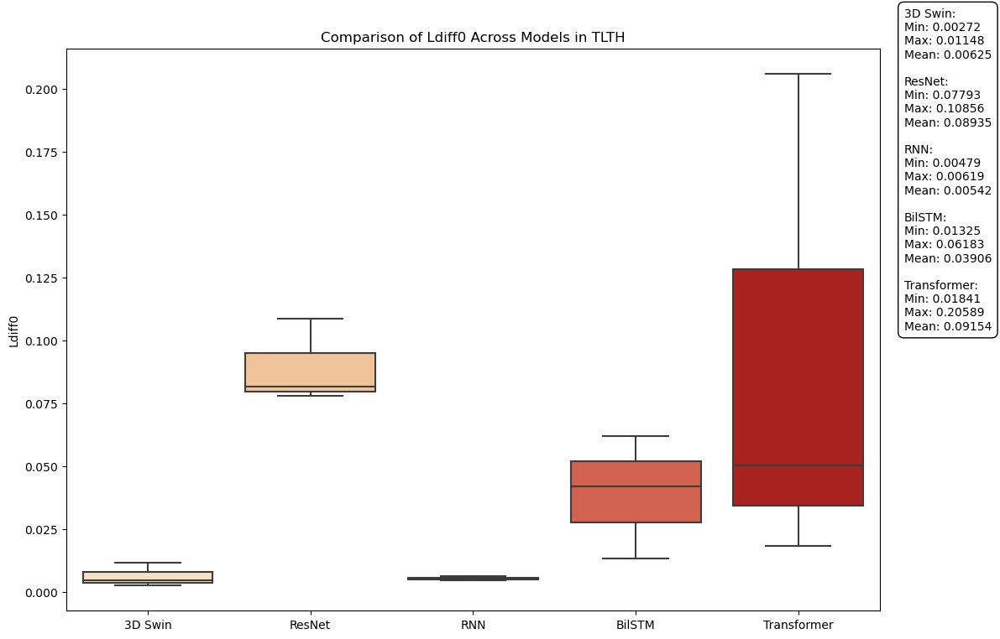

Plots saved to ./picture/TLTH


In [16]:
metrics = [
    'Lae_db10', 'Lae_db_l210',
    'Lae_db20', 'Lae_db_l220', 'Lae_stoi0', 'Lrec0', 'loudness_metric0', 
    'loudness0', 'f0_metric0', 'f0_hz0', 'amplitudes_metric0', 'amplitudes0',
    'amplitude_formants_hamon_metric0', 'amplitude_formants_hamon0',
    'freq_formants_hamon_hz_metric_20', 'freq_formants_hamon_hz_metric_60',
    'freq_formants_hamon0', 'amplitude_formants_noise_metric0', 'amplitude_formants_noise0',
    'freq_formants_noise_metric0', 'freq_formants_noise0', 
    'bandwidth_formants_noise_hz_metric0', 'bandwidth_formants_noise_hz0',
    'Ldiff0']

# Define the custom labels for each metric
labels = ['3D Swin', 'ResNet', 'RNN','BilSTM','Transformer']
colors = sns.color_palette('OrRd', len(labels))  # Use a color palette with enough colors

# Define a color map for the models
color_map = dict(zip(labels, colors))

# Directory to save the plots
output_dir = './picture/TLTH'
os.makedirs(output_dir, exist_ok=True)

# Create a separate plot for each metric
for metric in metrics:
    # Create a DataFrame suitable for seaborn
    data = [dfs[j][metric].dropna() for j in range(5)]  # Drop NA values
    df = pd.DataFrame({
        'Model': np.concatenate([np.full_like(data[j], labels[j], dtype=object) for j in range(5)]),
        'Value': np.concatenate(data)
    })

    # Create the boxplot using seaborn
    plt.figure(figsize=(12, 8))  # Adjust size for better readability
    sns.boxplot(x='Model', y='Value', data=df, palette=color_map)
    
    # Add statistics as external annotations
    stats_text = []
    for j, label in enumerate(labels):
        model_data = df[df['Model'] == label]['Value']
        if len(model_data) > 0:  # Ensure there is data to compute statistics
            min_val = np.min(model_data)
            max_val = np.max(model_data)
            mean_val = np.mean(model_data)
            
            # Append statistics text
            stats_text.append(f'{label}:\nMin: {min_val:.5f}\nMax: {max_val:.5f}\nMean: {mean_val:.5f}')
    
    # Create an annotation box outside the plot area
    stats_str = "\n\n".join(stats_text)
    plt.annotate(stats_str, xy=(1.03, 0.5), xycoords='axes fraction',
                 fontsize=10, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))
    
    plt.title(f'Comparison of {metric} Across Models in TLTH')
    plt.ylabel(metric)
    plt.xlabel('')  # Remove x-axis label for cleaner look
    # Save the figure to a file
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f'{metric}_TLTH.png'))
    plt.show()
    plt.close()  # Close the figure to avoid display

print(f'Plots saved to {output_dir}')

Spectrum of model 3D Swin and original audio PCC: 0.07513009504662797
Spectrum of model ResNet and original audio PCC: 0.04078883275278641
Spectrum of model RNN and original audio PCC: 0.07251309085973069
Spectrum of model BilSTM and original audio PCC: 0.0932024774348128
Spectrum of model Transformer and original audio PCC: 0.05687780970679486


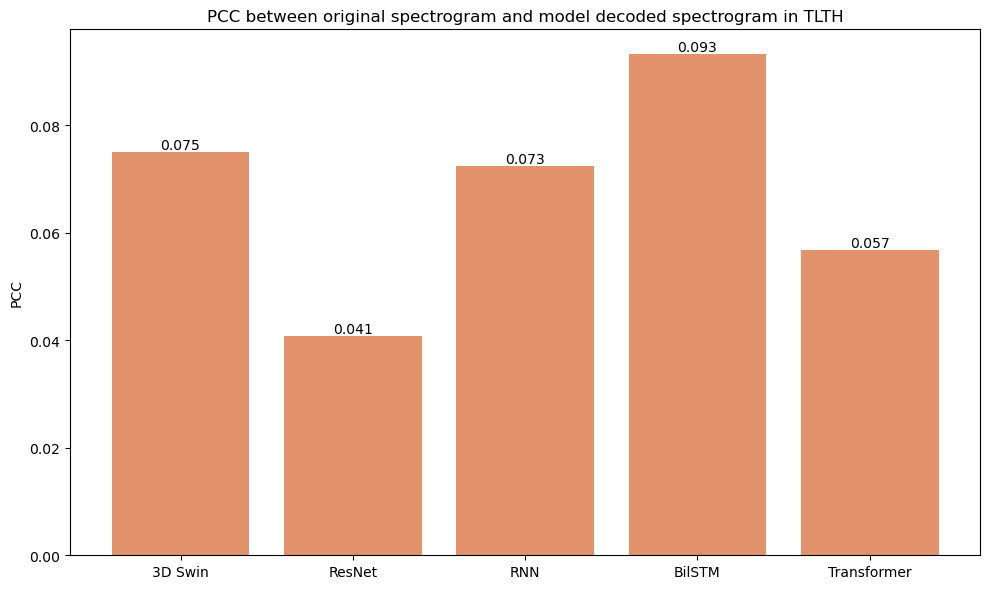

In [37]:
original_file = "./example_data/2022_11_04/KeywordReading_Overt_R01.wav"
decoded_folders = [
    "./output/e2a/HB02_3DSWIN_TLTH/",
    "./output/e2a/HB02_RESNET_TLTH/",
    "./output/e2a/HB02_RNN_TLTH/",
    "./output/e2a/HB02_BILSTM_TLTH/",
    "./output/e2a/HB02_TRANS_TLTH/"
]
rate_orig, data_orig = wavfile.read(original_file)
decoded_file_name = "sample_21_HB02.pngdenoiseecogwave.wav"
model_names = ['3D Swin', 'ResNet', 'RNN', 'BilSTM', 'Transformer']
pcc_results = []

for i, folder in enumerate(decoded_folders):
    decoded_file = os.path.join(folder, decoded_file_name)
    rate_decoded, data_decoded = wavfile.read(decoded_file)
    min_length = min(len(data_orig), len(data_decoded))
    data_orig_trimmed = data_orig[:min_length]
    data_decoded_trimmed = data_decoded[:min_length]
    
    f_orig, t_orig, Sxx_orig = spectrogram(data_orig_trimmed, rate_orig)
    f_decoded, t_decoded, Sxx_decoded = spectrogram(data_decoded_trimmed, rate_decoded)

    Sxx_orig_flat = Sxx_orig.flatten()
    Sxx_decoded_flat = Sxx_decoded.flatten()
    pcc, _ = pearsonr(Sxx_orig_flat, Sxx_decoded_flat)
    model_name = model_names[i]
    pcc_results.append((model_name, pcc))
    print(f"Spectrum of model {model_name} and original audio PCC: {pcc}")
    
models, pcc_values = zip(*pcc_results)
plt.figure(figsize=(10, 6))
bars = plt.bar(models, pcc_values, color='#e3936c')
for bar, value in zip(bars, pcc_values):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), 
             f'{value:.3f}', ha='center', va='bottom', color='black', fontsize=10)
plt.ylabel('PCC')
plt.title('PCC between original spectrogram and model decoded spectrogram in TLTH')
plt.tight_layout()
output_dir = './picture/TLTH'
plt.savefig(os.path.join(output_dir, 'Comparison of PCC among models_TLTH.png'))
# 显示图表
plt.show()

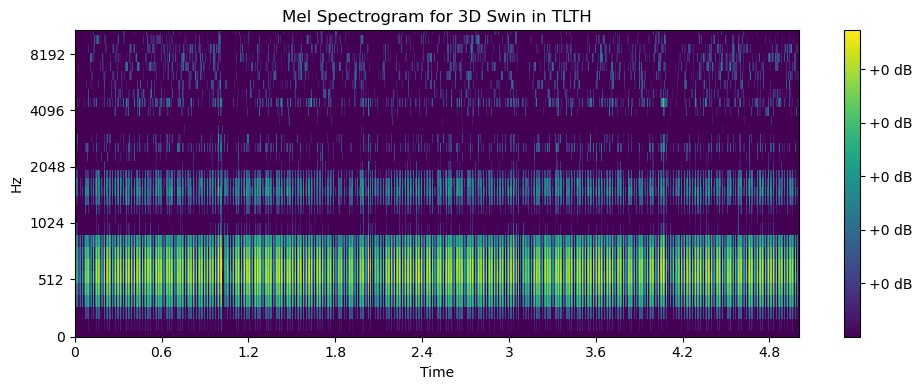

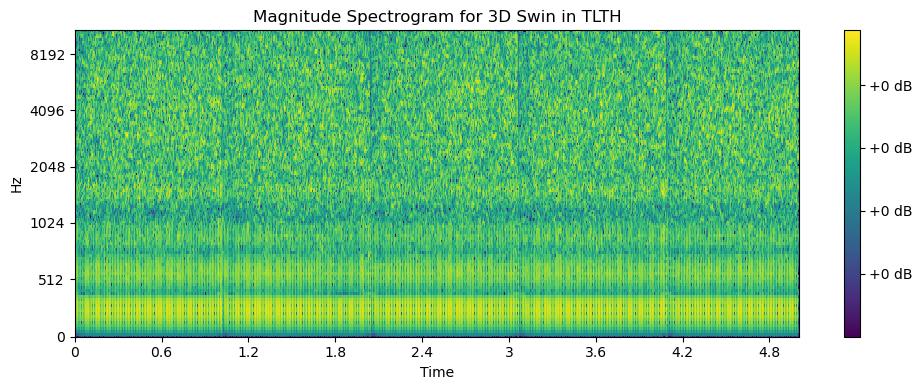

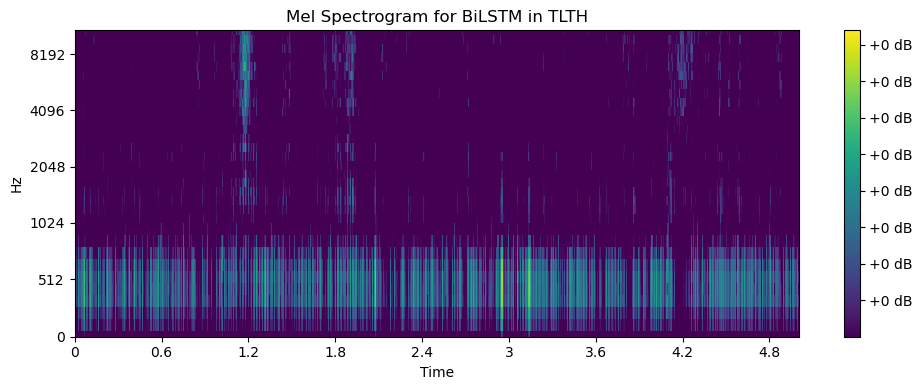

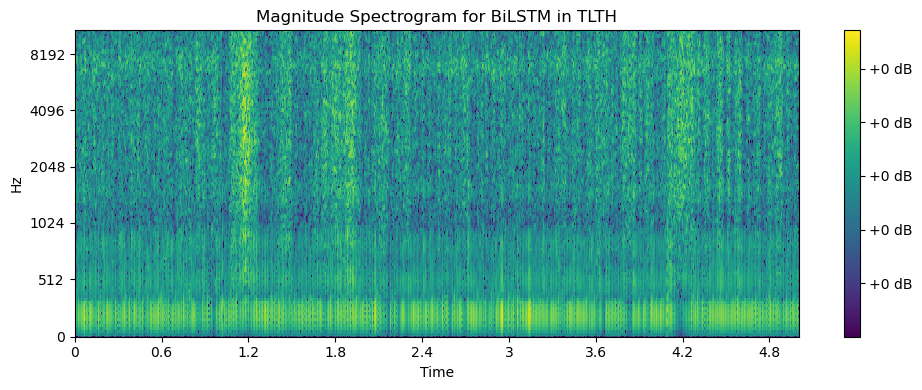

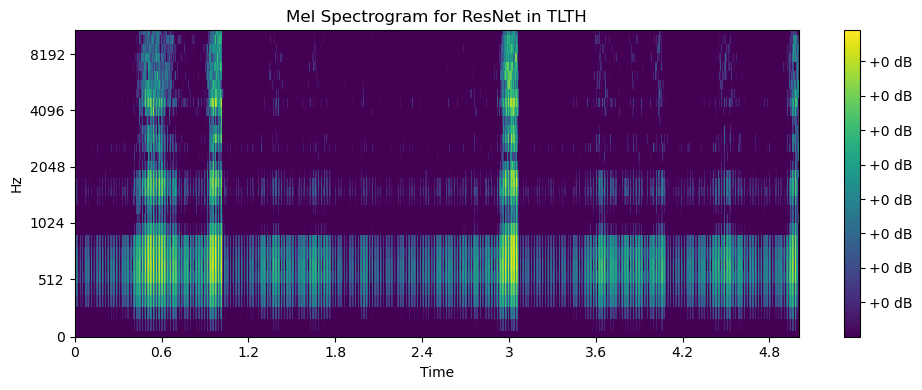

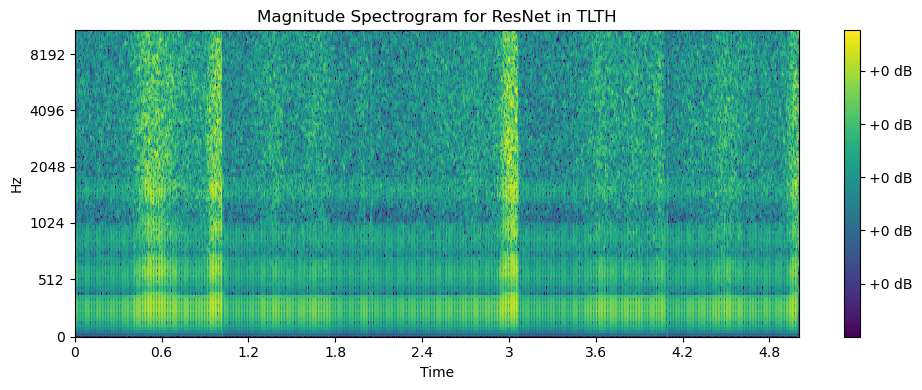

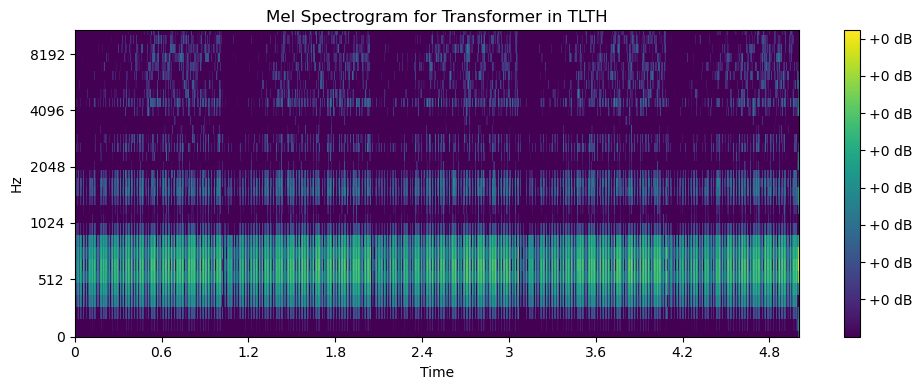

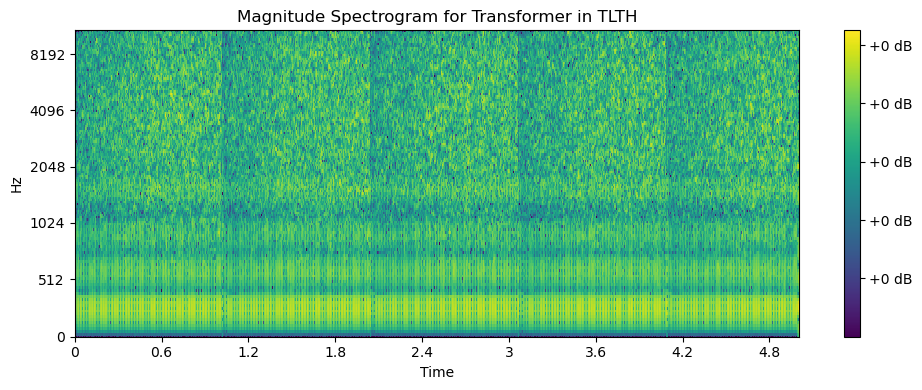

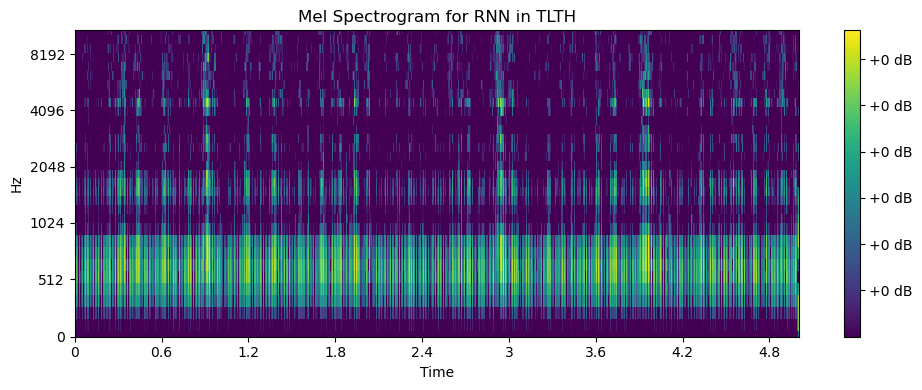

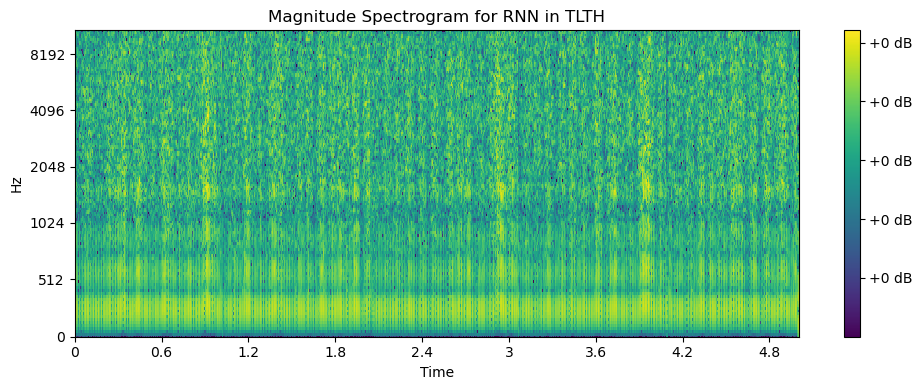

In [69]:
sr = 16000               # Sample rate
n_fft = 256             # Number of FFT points
frame_shift = 0.0125     # Frame shift in seconds
frame_length = 0.05      # Frame length in seconds
hop_length = 64 #int(sr * frame_shift)  # Number of samples per frame shift
win_length = 256 #int(sr * frame_length) # Number of samples per frame length
n_mels = 32            # Number of Mel bands to generate
power = 1.2              # Exponent for amplifying the predicted magnitude
n_iter = 100             # Number of inversion iterations
preemphasis = 0.97       # Pre-emphasis filter coefficient, or None
max_db = 100             # Maximum decibel value
ref_db = 20              # Reference decibel value
top_db = 15              # Threshold for trimming silence

def get_spectrograms(fpath,sr):
    y, sr = librosa.load(fpath, sr=sr)
    y = y[:sr * 5]
    y, _ = librosa.effects.trim(y, top_db=top_db)
    y = np.append(y[0], y[1:] - preemphasis * y[:-1])
    linear = librosa.stft(y=y, n_fft=n_fft, hop_length=hop_length, win_length=win_length)
    mag = np.abs(linear)  # (1+n_fft//2, T)
    mel_basis = librosa.filters.mel(sr, n_fft, n_mels)  # (n_mels, 1+n_fft//2)
    mel = np.dot(mel_basis, mag)  # (n_mels, T)
    mel = 20 * np.log10(np.maximum(1e-5, mel))
    mag = 20 * np.log10(np.maximum(1e-5, mag))
    mel = np.clip((mel - ref_db + max_db) / max_db, 1e-8, 1)
    mag = np.clip((mag - ref_db + max_db) / max_db, 1e-8, 1)
    mel = mel.T.astype(np.float32)  # (T, n_mels)
    mag = mag.T.astype(np.float32)  # (T, 1+n_fft//2)
    return mel, mag

def plot_spectrogram(spectrogram, title, sr, hop_length, output_dir, file_name):
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(spectrogram, sr=sr, hop_length=hop_length, x_axis='time', y_axis='mel',cmap = 'viridis')
    plt.colorbar(format='%+2.0f dB')
    plt.title(title)
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, file_name))
    plt.show()
    plt.close()
    
labels = ['3D Swin', 'BiLSTM', 'ResNet', 'Transformer', 'RNN']
audio_file = [
    './output/e2a/HB02_3DSWIN_TLTH/sample_21_HB02.pngdenoiseecogwave.wav',
    './output/e2a/HB02_BILSTM_TLTH/sample_21_HB02.pngdenoiseecogwave.wav',
    './output/e2a/HB02_RESNET_TLTH/sample_21_HB02.pngdenoiseecogwave.wav',
    './output/e2a/HB02_TRANS_TLTH/sample_21_HB02.pngdenoiseecogwave.wav',
    './output/e2a/HB02_RNN_TLTH/sample_21_HB02.pngdenoiseecogwave.wav',
]  
output_dir = "./picture/TLTH"
for i, file_path in enumerate(audio_file):
    label = labels[i]
    mel_spectrogram, magnitude_spectrogram = get_spectrograms(file_path, sr)
    plot_spectrogram(mel_spectrogram.T, f'Mel Spectrogram for {label} in TLTH', sr, hop_length, output_dir, f'{label}_mel_spectrogram_TLTH.png')
    plot_spectrogram(magnitude_spectrogram.T, f'Magnitude Spectrogram for {label} in TLTH', sr, hop_length, output_dir, f'{label}_magnitude_spectrogram_TLTH.png')

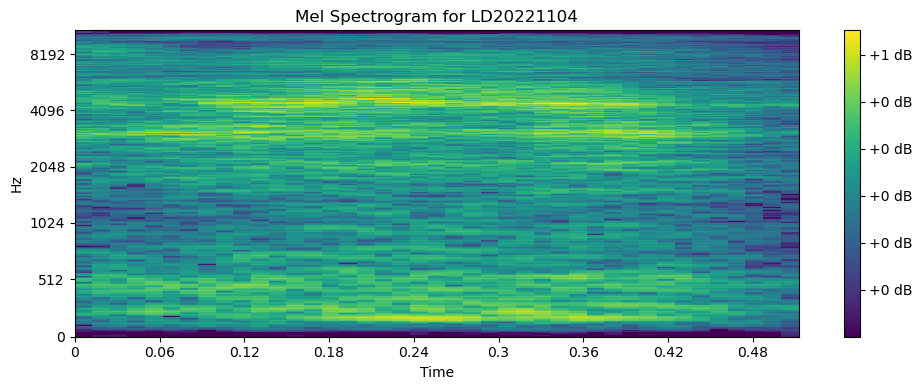

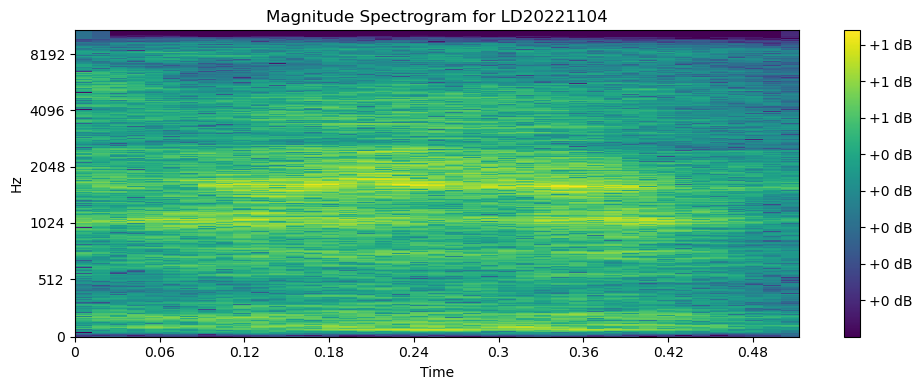

In [82]:
sr = 16000               # Sample rate
n_fft = 2048             # Number of FFT points
frame_shift = 0.0125     # Frame shift in seconds
frame_length = 0.05      # Frame length in seconds
hop_length = int(sr * frame_shift)  # Number of samples per frame shift
win_length = int(sr * frame_length) # Number of samples per frame length
n_mels = 512             # Number of Mel bands to generate
power = 1.2              # Exponent for amplifying the predicted magnitude
n_iter = 100             # Number of inversion iterations
preemphasis = 0.97       # Pre-emphasis filter coefficient, or None
max_db = 100             # Maximum decibel value
ref_db = 20              # Reference decibel value
top_db = 15              # Threshold for trimming silence
duration = 5

def get_spectrograms(fpath,sr):
    y, sr = librosa.load(fpath, sr=sr,duration = duration)
    y, _ = librosa.effects.trim(y, top_db=top_db)
    y = np.append(y[0], y[1:] - preemphasis * y[:-1])
    linear = librosa.stft(y=y, n_fft=n_fft, hop_length=hop_length, win_length=win_length)
    mag = np.abs(linear)  # (1+n_fft//2, T)
    mel_basis = librosa.filters.mel(sr, n_fft, n_mels)  # (n_mels, 1+n_fft//2)
    mel = np.dot(mel_basis, mag)  # (n_mels, T)
    mel = 20 * np.log10(np.maximum(1e-5, mel))
    mag = 20 * np.log10(np.maximum(1e-5, mag))
    mel = np.clip((mel - ref_db + max_db) / max_db, 1e-8, 1)
    mag = np.clip((mag - ref_db + max_db) / max_db, 1e-8, 1)
    mel = mel.T.astype(np.float32)  # (T, n_mels)
    mag = mag.T.astype(np.float32)  # (T, 1+n_fft//2)
    return mel, mag

def plot_spectrogram(spectrogram, title, sr, hop_length, output_dir, file_name):
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(spectrogram, sr=sr, hop_length=hop_length, x_axis='time', y_axis='mel', cmap = 'viridis')
    plt.colorbar(format='%+2.0f dB')
    plt.title(title)
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, file_name))
    plt.show()
    plt.close()
audio_file = ['./example_data/2022_11_04/KeywordReading_Overt_R01.wav']
output_dir = "./picture/TLTH"
for i, file_path in enumerate(audio_file):
    label = 'LD20221104'
    mel_spectrogram, magnitude_spectrogram = get_spectrograms(file_path, sr)
    plot_spectrogram(mel_spectrogram.T, f'Mel Spectrogram for {label}', sr, hop_length, output_dir, f'{label}_mel_spectrogram.png')
    plot_spectrogram(magnitude_spectrogram.T, f'Magnitude Spectrogram for {label}', sr, hop_length, output_dir, f'{label}_magnitude_spectrogram.png')

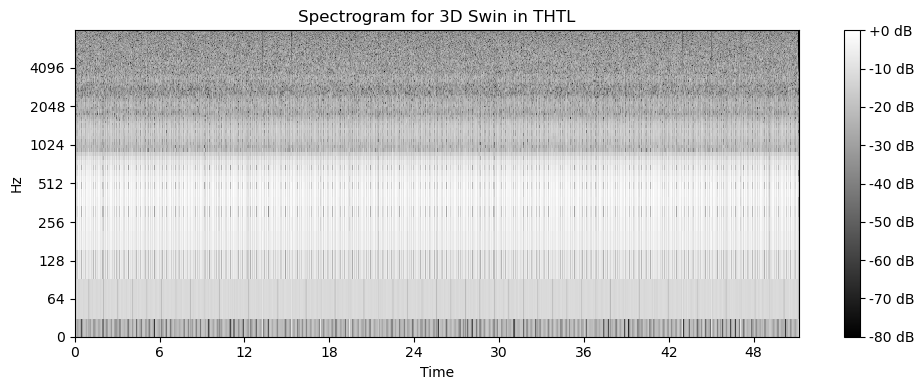

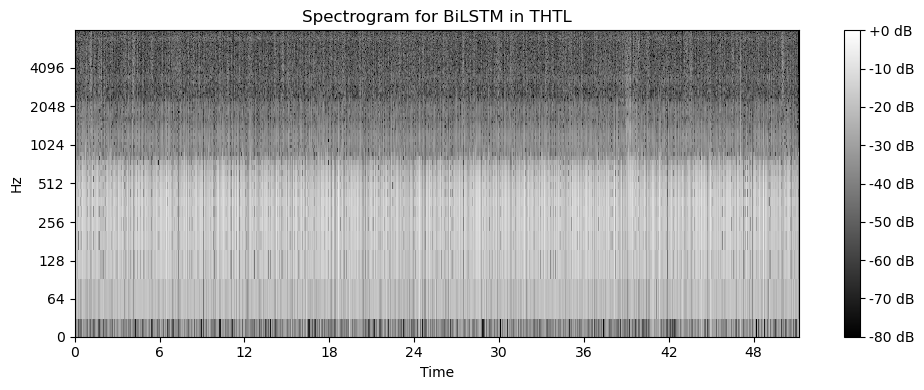

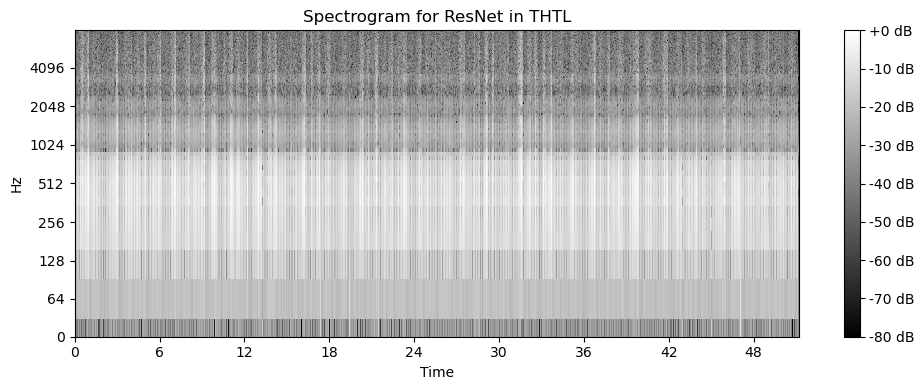

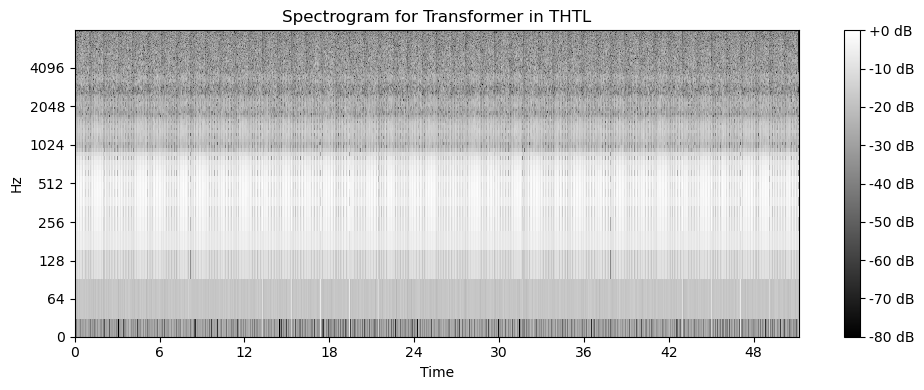

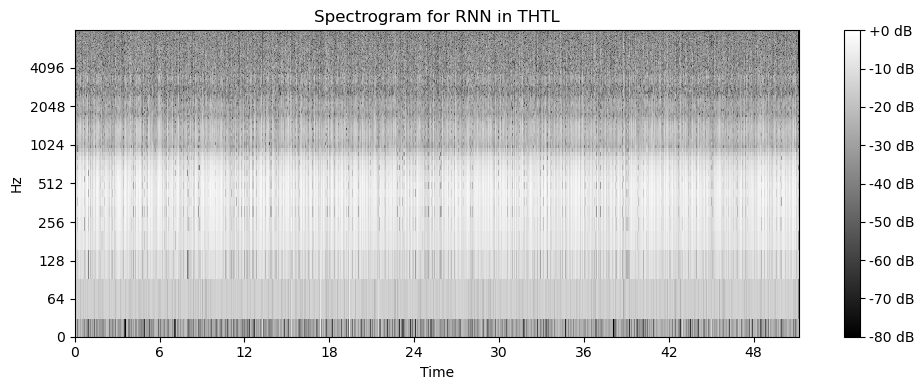

In [77]:
sr = 16000  # Sample rate
n_fft = 256  # Number of FFT points
hop_length = 64  # Number of samples between frames
n_mels = 32
labels = ['3D Swin', 'BiLSTM', 'ResNet', 'Transformer', 'RNN']
audio_file = [
    './output/e2a/HB02_3DSWIN_TLTH/sample_21_HB02.pngdenoiseecogwave.wav',
    './output/e2a/HB02_BILSTM_TLTH/sample_21_HB02.pngdenoiseecogwave.wav',
    './output/e2a/HB02_RESNET_TLTH/sample_21_HB02.pngdenoiseecogwave.wav',
    './output/e2a/HB02_TRANS_TLTH/sample_21_HB02.pngdenoiseecogwave.wav',
    './output/e2a/HB02_RNN_TLTH/sample_21_HB02.pngdenoiseecogwave.wav',
]  
output_dir = "./picture/TLTH"
def create_and_save_spectrogram(file_path, label, sr, n_fft, hop_length, output_dir):
    # Load audio file
    y, sr = librosa.load(file_path, sr=sr)
    D = librosa.stft(y, n_fft=n_fft, hop_length=hop_length)
    S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(S_db, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log', cmap = 'gray')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Spectrogram for {label} in THTL')
    plt.tight_layout()
    file_name = f'Spectrogram for {label} in TLTH.png'
    plt.savefig(os.path.join(output_dir, file_name))
    plt.show()
    plt.close()  

for i, file_path in enumerate(audio_file):
    label = labels[i]
    create_and_save_spectrogram(file_path, label, sr, n_fft, hop_length, output_dir)

# HB02 - 10 Epoch

Spectrum of model BilSTM and original audio PCC: 0.0015455313785568607
Spectrum of model ResNet and original audio PCC: 0.048964450481360014
Spectrum of model RNN and original audio PCC: 0.06687525743435918


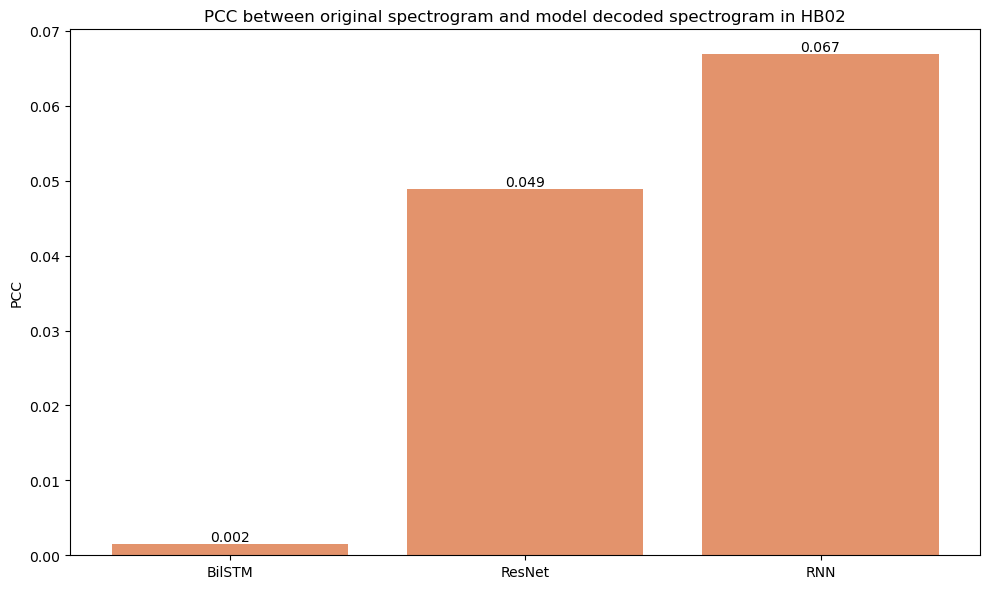

In [21]:
original_file = "./example_data/HB02.wav"
decoded_folders = [
    "./output/e2a/K-Fold/HB02/HB02_BILSTM_T234T1",
    "./output/e2a/K-Fold/HB02/HB02_RESNET_T234T1",
    "./output/e2a/K-Fold/HB02/HB02_RNN_T234T1"
]
rate_orig, data_orig = wavfile.read(original_file)
decoded_file_name = "sample_11_HB02.pngdenoiseecogwave.wav"
model_names = ['BilSTM', 'ResNet', 'RNN']
pcc_results = []

for i, folder in enumerate(decoded_folders):
    decoded_file = os.path.join(folder, decoded_file_name)
    rate_decoded, data_decoded = wavfile.read(decoded_file)
    min_length = min(len(data_orig), len(data_decoded))
    data_orig_trimmed = data_orig[:min_length]
    data_decoded_trimmed = data_decoded[:min_length]
    
    f_orig, t_orig, Sxx_orig = spectrogram(data_orig_trimmed, rate_orig)
    f_decoded, t_decoded, Sxx_decoded = spectrogram(data_decoded_trimmed, rate_decoded)

    Sxx_orig_flat = Sxx_orig.flatten()
    Sxx_decoded_flat = Sxx_decoded.flatten()
    pcc, _ = pearsonr(Sxx_orig_flat, Sxx_decoded_flat)
    model_name = model_names[i]
    pcc_results.append((model_name, pcc))
    print(f"Spectrum of model {model_name} and original audio PCC: {pcc}")
    
models, pcc_values = zip(*pcc_results)
plt.figure(figsize=(10, 6))
bars = plt.bar(models, pcc_values, color='#e3936c')
for bar, value in zip(bars, pcc_values):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), 
             f'{value:.3f}', ha='center', va='bottom', color='black', fontsize=10)
plt.ylabel('PCC')
plt.title('PCC between original spectrogram and model decoded spectrogram in HB02')
plt.tight_layout()
output_dir = './picture/HB02-KFOLD'
plt.savefig(os.path.join(output_dir, 'Comparison of PCC among models in HB02.png'))
plt.show()

In [ ]:
file_paths = [
    './output/e2a/HB02_3DSWIN_TLTH/epoch_log_test.csv', 
    './output/e2a/HB02_BILSTM_TLTH/epoch_log_test.csv', 
    './output/e2a/HB02_RESNET_TLTH/epoch_log_test.csv',
    './output/e2a/HB02_RNN_TLTH/epoch_log_test.csv',  
    './output/e2a/HB02_TRANS_TLTH/epoch_log_test.csv',
]
dfs = [pd.read_csv(file_path) for file_path in file_paths]
#dfs[0].head(), dfs[1].head(), dfs[2].head(), dfs[3].head()

In [ ]:
#专用出图
#'Lae_a10', 'Lae_a_l210','Lae_a20', 'Lae_a_l220','Lexp0' 都为0所以不分析
metrics = [
    'Lae_db10', 'Lae_db_l210',
    'Lae_db20', 'Lae_db_l220', 'Lae_stoi0', 'Lrec0', 'loudness_metric0', 
    'loudness0', 'f0_metric0', 'f0_hz0', 'amplitudes_metric0', 'amplitudes0',
    'amplitude_formants_hamon_metric0', 'amplitude_formants_hamon0',
    'freq_formants_hamon_hz_metric_20', 'freq_formants_hamon_hz_metric_60',
    'freq_formants_hamon0', 'amplitude_formants_noise_metric0', 'amplitude_formants_noise0',
    'freq_formants_noise_metric0', 'freq_formants_noise0', 
    'bandwidth_formants_noise_hz_metric0', 'bandwidth_formants_noise_hz0',
    'Ldiff0']

# Define the custom labels for each metric
labels = ['3D Swin', 'ResNet', 'RNN','BilSTM','Transformer']
colors = sns.color_palette('OrRd', len(labels))  # Use a color palette with enough colors
color_map = dict(zip(labels, colors))
output_dir = './picture/THTL'
os.makedirs(output_dir, exist_ok=True)

for metric in metrics:
    # Create a DataFrame suitable for seaborn
    data = [dfs[j][metric].dropna() for j in range(5)]  # Drop NA values
    df = pd.DataFrame({
        'Model': np.concatenate([np.full_like(data[j], labels[j], dtype=object) for j in range(5)]),
        'Value': np.concatenate(data)
    })

    plt.figure(figsize=(12, 8))  
    sns.boxplot(x='Model', y='Value', data=df, palette=color_map)
    
    stats_text = []
    for j, label in enumerate(labels):
        model_data = df[df['Model'] == label]['Value']
        if len(model_data) > 0:  # Ensure there is data to compute statistics
            min_val = np.min(model_data)
            max_val = np.max(model_data)
            mean_val = np.mean(model_data)
            stats_text.append(f'{label}:\nMin: {min_val:.5f}\nMax: {max_val:.5f}\nMean: {mean_val:.5f}')
    
    stats_str = "\n\n".join(stats_text)
    plt.annotate(stats_str, xy=(1.03, 0.5), xycoords='axes fraction',
                 fontsize=10, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))
    
    plt.title(f'Comparison of {metric} Across Models in THTL')
    plt.ylabel(metric)
    plt.xlabel('')  # Remove x-axis label for cleaner look
    # Save the figure to a file
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f'{metric}_THTL.png'))
    plt.show()
    plt.close()  # Close the figure to avoid display

print(f'Plots saved to {output_dir}')


# LD20221104 - 20 Epoch

Spectrum of model BilSTM and original audio PCC: 0.07608820005060023
Spectrum of model ResNet and original audio PCC: 0.03431393788341257
Spectrum of model RNN and original audio PCC: 0.07132650332835344


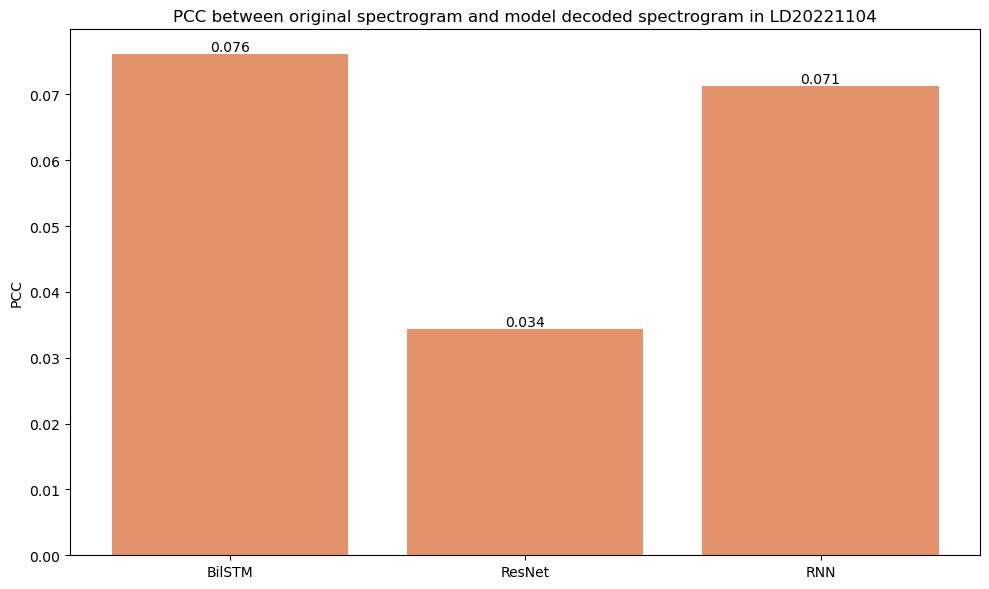

In [11]:
original_file = "./example_data/2022_11_04/KeywordReading_Overt_R01.wav"
decoded_folders = [
    "./output/e2a/K-Fold/LD20221104/LD20221104_BiLSTM_T12T1",
    "./output/e2a/K-Fold/LD20221104/LD20221104_ResNet_T12T1",
    "./output/e2a/K-Fold/LD20221104/LD20221104_RNN_T12T1"
]
rate_orig, data_orig = wavfile.read(original_file)
decoded_file_name = "sample_11_LD20221104.pngdenoiseecogwave.wav"
model_names = ['BilSTM', 'ResNet', 'RNN']
pcc_results = []

for i, folder in enumerate(decoded_folders):
    decoded_file = os.path.join(folder, decoded_file_name)
    rate_decoded, data_decoded = wavfile.read(decoded_file)
    min_length = min(len(data_orig), len(data_decoded))
    data_orig_trimmed = data_orig[:min_length]
    data_decoded_trimmed = data_decoded[:min_length]
    
    f_orig, t_orig, Sxx_orig = spectrogram(data_orig_trimmed, rate_orig)
    f_decoded, t_decoded, Sxx_decoded = spectrogram(data_decoded_trimmed, rate_decoded)

    Sxx_orig_flat = Sxx_orig.flatten()
    Sxx_decoded_flat = Sxx_decoded.flatten()
    pcc, _ = pearsonr(Sxx_orig_flat, Sxx_decoded_flat)
    model_name = model_names[i]
    pcc_results.append((model_name, pcc))
    print(f"Spectrum of model {model_name} and original audio PCC: {pcc}")
    
models, pcc_values = zip(*pcc_results)
plt.figure(figsize=(10, 6))
bars = plt.bar(models, pcc_values, color='#e3936c')
for bar, value in zip(bars, pcc_values):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), 
             f'{value:.3f}', ha='center', va='bottom', color='black', fontsize=10)
plt.ylabel('PCC')
plt.title('PCC between original spectrogram and model decoded spectrogram in LD20221104')
plt.tight_layout()
output_dir = './picture/LD20221104-KFOLD'
plt.savefig(os.path.join(output_dir, 'Comparison of PCC among models in LD20221104.png'))
plt.show()

In [ ]:
file_paths = [
    './output/e2a/HB02_3DSWIN_TLTH/epoch_log_test.csv', 
    './output/e2a/HB02_BILSTM_TLTH/epoch_log_test.csv', 
    './output/e2a/HB02_RESNET_TLTH/epoch_log_test.csv',
    './output/e2a/HB02_RNN_TLTH/epoch_log_test.csv',  
    './output/e2a/HB02_TRANS_TLTH/epoch_log_test.csv',
]
dfs = [pd.read_csv(file_path) for file_path in file_paths]
#dfs[0].head(), dfs[1].head(), dfs[2].head(), dfs[3].head()

In [ ]:
#专用出图
#'Lae_a10', 'Lae_a_l210','Lae_a20', 'Lae_a_l220','Lexp0' 都为0所以不分析
metrics = [
    'Lae_db10', 'Lae_db_l210',
    'Lae_db20', 'Lae_db_l220', 'Lae_stoi0', 'Lrec0', 'loudness_metric0', 
    'loudness0', 'f0_metric0', 'f0_hz0', 'amplitudes_metric0', 'amplitudes0',
    'amplitude_formants_hamon_metric0', 'amplitude_formants_hamon0',
    'freq_formants_hamon_hz_metric_20', 'freq_formants_hamon_hz_metric_60',
    'freq_formants_hamon0', 'amplitude_formants_noise_metric0', 'amplitude_formants_noise0',
    'freq_formants_noise_metric0', 'freq_formants_noise0', 
    'bandwidth_formants_noise_hz_metric0', 'bandwidth_formants_noise_hz0',
    'Ldiff0']

# Define the custom labels for each metric
labels = ['3D Swin', 'ResNet', 'RNN','BilSTM','Transformer']
colors = sns.color_palette('OrRd', len(labels))  # Use a color palette with enough colors
color_map = dict(zip(labels, colors))
output_dir = './picture/THTL'
os.makedirs(output_dir, exist_ok=True)

for metric in metrics:
    # Create a DataFrame suitable for seaborn
    data = [dfs[j][metric].dropna() for j in range(5)]  # Drop NA values
    df = pd.DataFrame({
        'Model': np.concatenate([np.full_like(data[j], labels[j], dtype=object) for j in range(5)]),
        'Value': np.concatenate(data)
    })

    plt.figure(figsize=(12, 8))  
    sns.boxplot(x='Model', y='Value', data=df, palette=color_map)
    
    stats_text = []
    for j, label in enumerate(labels):
        model_data = df[df['Model'] == label]['Value']
        if len(model_data) > 0:  # Ensure there is data to compute statistics
            min_val = np.min(model_data)
            max_val = np.max(model_data)
            mean_val = np.mean(model_data)
            stats_text.append(f'{label}:\nMin: {min_val:.5f}\nMax: {max_val:.5f}\nMean: {mean_val:.5f}')
    
    stats_str = "\n\n".join(stats_text)
    plt.annotate(stats_str, xy=(1.03, 0.5), xycoords='axes fraction',
                 fontsize=10, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))
    
    plt.title(f'Comparison of {metric} Across Models in THTL')
    plt.ylabel(metric)
    plt.xlabel('')  # Remove x-axis label for cleaner look
    # Save the figure to a file
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, f'{metric}_THTL.png'))
    plt.show()
    plt.close()  # Close the figure to avoid display

print(f'Plots saved to {output_dir}')


Comparing ./picture/THTL/3D Swin_mel_spectrogram_THTL.png: MSE = 975.61, SSIM = 0.51
Comparing ./picture/THTL/BiLSTM_mel_spectrogram_THTL.png: MSE = 1260.16, SSIM = 0.53
Comparing ./picture/THTL/ResNet_mel_spectrogram_THTL.png: MSE = 1169.34, SSIM = 0.52
Comparing ./picture/THTL/Transformer_mel_spectrogram_THTL.png: MSE = 1340.92, SSIM = 0.50
Comparing ./picture/THTL/RNN_mel_spectrogram_THTL.png: MSE = 1432.32, SSIM = 0.52


C:\Users\12240\AppData\Local\Temp\ipykernel_9136\1790401113.py:53: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout(pad=3.0)


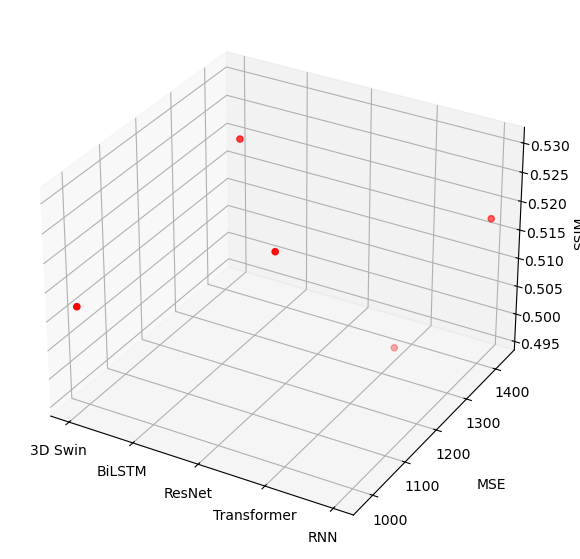

In [33]:
import cv2
import numpy as np
from skimage.metrics import structural_similarity as ssim
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def load_image(image_path):
    image = cv2.imread(image_path)
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

def mse(imageA, imageB):
    err = np.sum((imageA.astype("float") - imageB.astype("float")) ** 2)
    err /= float(imageA.shape[0] * imageA.shape[1])
    return err

def calculate_mse_ssim(imageA, imageB):
    m = mse(imageA, imageB)
    s = ssim(imageA, imageB)
    return m, s

def main():
    imageA = load_image('./picture/THTL/HB02_mel_spectrogram.png')
    image_files = [
        './picture/THTL/3D Swin_mel_spectrogram_THTL.png',
        './picture/THTL/BiLSTM_mel_spectrogram_THTL.png',
        './picture/THTL/ResNet_mel_spectrogram_THTL.png',
        './picture/THTL/Transformer_mel_spectrogram_THTL.png',
        './picture/THTL/RNN_mel_spectrogram_THTL.png'
    ]
    labels = ['3D Swin', 'BiLSTM', 'ResNet', 'Transformer', 'RNN']
    mse_values = []
    ssim_values = []
    for image_file in image_files:
        imageB = load_image(image_file)
        m, s = calculate_mse_ssim(imageA, imageB)
        mse_values.append(m)
        ssim_values.append(s)
        print(f"Comparing {image_file}: MSE = {m:.2f}, SSIM = {s:.2f}")
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')
    
    # X 轴为图像索引，Y 轴为 MSE，Z 轴为 SSIM
    x = np.arange(len(labels))
    y = mse_values
    z = ssim_values
    ax.scatter(x, y, z, c='r', marker='o')
    ax.yaxis.labelpad = 15
    ax.zaxis.labelpad = 6
    ax.set_ylabel('MSE')
    ax.set_zlabel('SSIM',rotation=90)
    ax.set_xticks(x)
    ax.set_xticklabels(labels)
    plt.tight_layout(pad=3.0)
    plt.show()
if __name__ == "__main__":
    main()